In [1]:
# Install prerequisites for evaluation
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.interpolate import interp1d
import importlib
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
from os import listdir, path
from IPython.display import display, Markdown
import math

import os
import sys

# if current working directory includes "evaluation" change to parent directory
if "evaluation" in os.getcwd():
    os.chdir("..")
    # Add parent directory to sys.path
    sys.path.append(os.getcwd())



# Verify
print(f"Current working directory: {os.getcwd()}")
print(f"sys.path: {sys.path}")

Current working directory: /root/oxn
sys.path: ['/usr/lib/python311.zip', '/usr/lib/python3.11', '/usr/lib/python3.11/lib-dynload', '', '/root/oxn/venv/lib/python3.11/site-packages', '/root/oxn']


# Short Setup Test

In [2]:
# Import report
from gevent import monkey
monkey.patch_all()
import evaluation.evaluation as evaluation


importlib.reload(evaluation)

from evaluation.evaluation import Report

assert os.path.exists("reports"), "No reports directory found. Please run the experiments first."

files_in_direcotory = listdir("reports")

# sort them by date
files_in_direcotory.sort(key=lambda x: path.getctime(path.join("reports",x)))
files_in_direcotory = files_in_direcotory[::-1]

# Load the last experiment
last_experiment = files_in_direcotory[0]

report_path = path.join("reports", last_experiment.replace(".yaml",".yaml"))
report = Report.from_file(report_path)
print(f"Loaded report {last_experiment}")

assert report is not [], "No report found. Please run the experiments first."
assert isinstance(report, Report), "Report is not of type Report"


assert report.interactions is not [], "No interactions found."
assert report.interactions[0] is not [], "No interactions found. "
assert report.interactions[0].response_data is not [], "No data in interaction found"


Loaded report report_2025-05-01_14-38-24.yaml


# Load the most recent set of reports

In [3]:
# invert the files_in_direcotry list 
#files_in_direcotory = files_in_direcotory[::-1]

experiments_map = {
    "recommendation_k8_base_1m_otel": None,
    "recommendation_k8_base_1s_otel": None,
    "recommendation_k8_base_5_percent": None,
    "recommendation_k8_base_10_percent": None,
    "recommendation_k8_base_50_percent": None,
    "recommendation_k8_delay_1m_otel": None,
    "recommendation_k8_delay_1s_otel": None,
    "recommendation_k8_delay_5_percent": None,
    "recommendation_k8_delay_10_percent": None
}


# iterate over all reports and find a string in them
print("Searching for most recent experiments in list of reports " + len(files_in_direcotory).__str__())
for file in files_in_direcotory:
    report_path = path.join("reports", file)
    # read the file as a string
    with open(report_path, "r") as f:
        content = f.read()
        # iterate over all experiments and check if the string contains the experiment name
        
        for experiment in experiments_map.keys():
            if experiment in content:
                if experiments_map[experiment]:
                    print(f"Found {experiment} in {file} but already found in {experiments_map[experiment]}. Did the recent run not included all experiments?")
                    continue
                experiments_map[experiment] = file
                print(f"Found {experiment} in {file}")
                break
    
    if all(experiments_map.values()):
        print("All experiments found")
        break
        

Searching for most recent experiments in list of reports 5
Found recommendation_k8_base_50_percent in report_2025-05-01_14-38-24.yaml
Found recommendation_k8_base_10_percent in report_2025-05-01_14-09-20.yaml
Found recommendation_k8_base_5_percent in report_2025-05-01_13-40-13.yaml
Found recommendation_k8_base_1s_otel in report_2025-05-01_13-11-11.yaml
Found recommendation_k8_base_1m_otel in report_2025-05-01_12-42-09.yaml


Reload evaluation file and caches (mainly for dev)

In [4]:
# Patch all and reload evaluation module
monkey.patch_all()
importlib.reload(evaluation)

# cache the dataframes
cached_dataframes_kepler_pods = []
cached_dataframes_kepler_namespace = []

In [5]:

# Function to load a report and extract specific interactions
from code import interact


def load_report_interactions(report_directory, report_name, response_name, treatment_name):
    report_path = os.path.join(report_directory, report_name)
    if os.path.exists(report_path):
        report = Report.from_file(report_path)
        #print(report.interactions)
        selected_interactions = [
            interaction for interaction in report.interactions
            if interaction.response_name == response_name and interaction.treatment_name == treatment_name
        ]
        print(f"Found {len(selected_interactions)} interactions for {report_name} and {treatment_name}.")
        return selected_interactions[0] if selected_interactions else None
    else:
        print(f"Report {report_name} not found.")
        return None      
        
def load_reports_and_normalize_time(cached_dataframes, report_directory, response_name, treatment_names, report_names):
    response_dataframes = cached_dataframes or []
    # Load the interactions if not already loaded
    if not response_dataframes or len(response_dataframes) == 0:
        print(f"Loading dataframes from reports because cached dataframes are empty.")
        for report_name in report_names:
            for treatment_name in treatment_names:
                interaction = load_report_interactions(report_directory, report_name, response_name, treatment_name)
                if interaction:
                    #print(interaction)
                    #print(interaction.response_data)
                    # Add columns to identify the treatment and report
                    interaction.response_data["treatment"] = f"{report_name}_{treatment_name}"
                    interaction.response_data["treatment_start"] = interaction.treatment_start
                    interaction.response_data["treatment_end"] = interaction.treatment_end
                    interaction.response_data["report"] = report_name
                    interaction.response_data["label"] = f"{REPORT_LABELS[report_name]}"
                    response_dataframes.append(interaction.response_data.copy())  # Make an explicit copy
    else:
        print("Using cached dataframes.")
    cached_dataframes = response_dataframes

    # Normalize time and concatenate all dataframes
    if response_dataframes:
        normalized_dataframes = []
        treatment_start_time = None
        treatment_end_time = None

        assert isinstance(response_dataframes, list)

        for df in response_dataframes:
            assert isinstance(df, pd.DataFrame)
            # Convert index to datetime if needed and ensure both index and treatment_start have the same timezone
            if not pd.api.types.is_datetime64_any_dtype(df.index):
                df.index = pd.to_datetime(df.index)

            # Convert treatment_start and treatment_end to datetime if not already
            current_treatment_start = pd.to_datetime(df["treatment_start"].iloc[0])
            current_treatment_end = pd.to_datetime(df["treatment_end"].iloc[0])

            # Ensure both are timezone-naive or the same timezone-aware if applicable
            df.index = df.index.tz_localize(None)
            current_treatment_start = current_treatment_start.tz_localize(None)
            current_treatment_end = current_treatment_end.tz_localize(None)

            # Calculate the interval between data points in seconds
            time_interval = (df.index[1] - df.index[0]).total_seconds()

            # Add the experiment_seconds column
            df = df.copy()  # Work with a copy to avoid modifying a view
            df.loc[:, "experiment_seconds"] = (df.index - current_treatment_start).total_seconds()
            df.loc[:, "time_normalized"] = df["experiment_seconds"]

            # Set or verify consistent treatment start and end times for plotting
            if treatment_start_time is None:
                treatment_start_time = current_treatment_start
                treatment_end_time = current_treatment_end
            else:
                if treatment_start_time != current_treatment_start or treatment_end_time != current_treatment_end:
                    print(f"Warning: Inconsistent treatment start or end times for report {df['treatment'].iloc[0]}.")

            normalized_dataframes.append(df)
    else:
        print("No valid interactions found for the specified treatment names.")


    # Combine all the normalized dataframes
    combined_df = pd.concat(normalized_dataframes)
    return cached_dataframes, combined_df, treatment_start_time, treatment_end_time

def plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time):

    # Normalize t0 and t1 to seconds relative to treatment start time
    treatment_start_seconds = 0  # t0 is always 0 after normalization
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()

    # Get unique container names
    container_names = combined_df["container_name"].unique()

    # Determine the grid size for subplots
    num_containers = len(container_names)
    num_cols = 2  # Define the number of columns for the grid
    num_rows = math.ceil(num_containers / num_cols)

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten()  # Flatten in case of a 2D array to make iteration easier

    # Plot the data for each container_name in a subplot
    for idx, container_name in enumerate(container_names):
        ax = axes[idx]
        assert isinstance(ax, plt.Axes)
        container_df = combined_df[combined_df["container_name"] == container_name]

        for treatment, df in container_df.groupby("treatment"):
            #print(df["experiment_seconds"])
            ax.plot(df["experiment_seconds"], df[response_name], label=f"{treatment}")

        # Add vertical lines for treatment start and end times (normalized)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")

        ax.set_title(f"Container: {container_name}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel(response_name)
        #ax.set_xticks(range(0, int(treatment_end_seconds) + 1, 60))  # Show ticks every minute
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.legend()
        ax.grid()

    # Hide any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()
    
def plot_kepler_metrics_per_pod_seaborn(combined_df, response_name, treatment_end_time, treatment_start_time, container_key="container_name"):
    # Normalize t0 and t1 to seconds relative to treatment start time
    treatment_start_seconds = 0  # t0 is always 0 after normalization
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()

    # Get unique container names
    container_names = combined_df[container_key].unique()

    # Determine the grid size for subplots
    num_containers = len(container_names)
    num_cols = 2  # Define the number of columns for the grid
    num_rows = math.ceil(num_containers / num_cols)

    # Set the style for seaborn
    sns.set(style="whitegrid")
    sns.set_palette("pastel")

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten()  # Flatten in case of a 2D array to make iteration easier

    # hue is the list of all unique treatments
    hue = combined_df["treatment"].unique()
    
    # use a lowpass filter to smooth the data
    combined_df[response_name] = combined_df[response_name].rolling(window=6, center=True, min_periods=2).mean()
   
        

    # Plot the data for each container_name in a subplot
    for idx, container_name in enumerate(container_names):
        ax = axes[idx]
        container_df = combined_df[combined_df[container_key] == container_name]
        # Interpolate the data for smoothing
        for treatment, df in container_df.groupby("treatment"):
            if len(df) > 1:
                f = interp1d(df["experiment_seconds"], df[response_name], kind='cubic')
                experiment_seconds_new = np.linspace(df["experiment_seconds"].min(), df["experiment_seconds"].max(), num=500)
                response_interpolated = f(experiment_seconds_new)
                sns.lineplot(
                    x=experiment_seconds_new,
                    y=response_interpolated,
                    ax=ax,
                    label=f"{df['label'].iloc[0]}",
                    linewidth=2
                )
            else:
                print(f"Only one data point for {container_name} in treatment {treatment}.")
                """ sns.lineplot(
                    data=df,
                    x="experiment_seconds",
                    y=response_name,
                    ax=ax,
                    label=f"{treatment}",
                    palette="tab10",
                    linewidth=2
                ) """

        # Add vertical lines for treatment start and end times (normalized)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")

        ax.set_title(f"Container: {container_name}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel("Watt")
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.legend()

    # Hide any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

def plot_kepler_metrics_per_pod_seaborn_with_fill_below(combined_df, response_name, treatment_end_time, treatment_start_time):
    # Normalize t0 and t1 to seconds relative to treatment start time
    treatment_start_seconds = 0  # t0 is always 0 after normalization
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()

    # Get unique container names
    container_names = combined_df["container_name"].unique()

    # Determine the grid size for subplots
    num_containers = len(container_names)
    num_cols = 2  # Define the number of columns for the grid
    num_rows = math.ceil(num_containers / num_cols)

    # Set the style for seaborn
    sns.set(style="whitegrid")

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten()  # Flatten in case of a 2D array to make iteration easier

    # Plot the data for each container_name in a subplot
    for idx, container_name in enumerate(container_names):
        ax = axes[idx]
        container_df = combined_df[combined_df["container_name"] == container_name]

        # Interpolate the data for smoothing
        for treatment, df in container_df.groupby("treatment"):
            if len(df) > 1:
                f = interp1d(df["experiment_seconds"], df[response_name], kind='cubic')
                experiment_seconds_new = np.linspace(df["experiment_seconds"].min(), df["experiment_seconds"].max(), num=500)
                response_interpolated = f(experiment_seconds_new)
                ax.plot(
                    experiment_seconds_new,
                    response_interpolated,
                    label=f"{treatment}",
                    linewidth=2
                )
                ax.fill_between(
                    experiment_seconds_new,
                    response_interpolated,
                    alpha=0.2
                )
            else:
                sns.lineplot(
                    data=df,
                    x="experiment_seconds",
                    y=response_name,
                    ax=ax,
                    label=f"{treatment}",
                    palette="tab10",
                    linewidth=2
                )
                ax.fill_between(
                    df["experiment_seconds"],
                    df[response_name],
                    alpha=0.3
                )

        # Add vertical lines for treatment start and end times (normalized)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")

        ax.set_title(f"Container: {container_name}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel(response_name)
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.legend()

    # Hide any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

        
def plot_kepler_metrics(combined_df, response_name, treatment_end_time, treatment_start_time, container_namespace):

    # Normalize t0 and t1 to seconds relative to treatment start time
    treatment_start_seconds = 0  # t0 is always 0 after normalization
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    fig, ax = plt.subplots(figsize=(12, 6))

    

    namespace_df = combined_df[combined_df["container_namespace"] == container_namespace]
    
    # use a lowpass filter to smooth the data
    namespace_df[response_name] = namespace_df[response_name].rolling(window=4).mean()

    #print(namespace_df)

    for treatment, df in namespace_df.groupby("treatment"):
        #print(df["experiment_seconds"])
        ax.plot(df["experiment_seconds"], df[response_name], label=f"{treatment}")

    # Add vertical lines for treatment start and end times (normalized)
    ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
    ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")

    ax.set_title(f"Namespace: {container_namespace}")
    ax.set_xlabel("Time (seconds from experiment start)")
    ax.set_ylabel(response_name)
    #ax.set_xticks(range(0, int(treatment_end_seconds) + 1, 60))  # Show ticks every minute
    ax.set_xlim(-250, treatment_end_seconds + 250)
    ax.set_ylim(40, 70)
    
    ax.legend()
    ax.grid()

    
    # Adjust layout
    plt.tight_layout()
    plt.show()
   
def plot_kepler_metrics_seaborn(combined_df, response_name, treatment_end_time, treatment_start_time, container_namespace):
    # Normalize t0 and t1 to seconds relative to treatment start time
    treatment_start_seconds = 0  # t0 is always 0 after normalization
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
   

    namespace_df = combined_df[combined_df["container_namespace"] == container_namespace]
    
    # use a lowpass filter to smooth the data
    namespace_df[response_name] = namespace_df[response_name].rolling(window=2, center=True, min_periods=1).mean()
    
    

    sns.set_palette("pastel")

    for treatment, df in namespace_df.groupby("treatment"):
        # Interpolate to make it smoother
        x = df["experiment_seconds"]
        y = df[response_name]
        

        f_interpolate = interp1d(x, y, kind='cubic', fill_value='extrapolate')
        x_smooth = np.linspace(x.min(), x.max(), 500)
        y_smooth = f_interpolate(x_smooth)
        
       
        
        sns.lineplot(x=x_smooth, y=y_smooth, label=f"{df['label'].iloc[0]}", ax=ax)
        ax.fill_between(x_smooth, y_smooth, alpha=0.2)

    # Add vertical lines for treatment start and end times (normalized)
    ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
    ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")

    ax.set_title(f"Namespace: {container_namespace}")
    ax.set_xlabel("Time (seconds from fault injection)")
    ax.set_ylabel("Watt")
    ax.set_xlim(-250, treatment_end_seconds + 250)
    ax.set_ylim(50, 90)
    
    ax.legend()
    ax.grid()

    # Adjust layout
    plt.tight_layout()
    plt.show()

import math
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.interpolate import interp1d

def plot_individual_and_aggregated(combined_df, response_name, treatment_end_time, treatment_start_time, container_key="container_name", interpolation_kind="cubic", rolling_window=6):
    """
    Plots individual treatment curves (with smoothing and interpolation) along with the aggregated mean and standard deviation.
    
    Parameters:
        combined_df (DataFrame): The DataFrame containing experiment data.
        response_name (str): Column name to be used for the y-axis (e.g. metric to plot).
        treatment_end_time (datetime): End time of the treatment.
        treatment_start_time (datetime): Start time of the treatment.
        container_key (str): Column name that identifies the container (default is "container_name").
    """
    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    # Compute aggregated statistics by rounding experiment_seconds
    if 'rounded_experiment_seconds' not in combined_df.columns:
        combined_df['rounded_experiment_seconds'] = combined_df['experiment_seconds'].round(0)
    agg_df = (
        combined_df
        .groupby([container_key, 'rounded_experiment_seconds'])[response_name]
        .agg(['mean', 'std'])
        .reset_index()
    )
    
    # Get unique container names and determine grid dimensions for subplots
    container_names = combined_df[container_key].unique()
    num_containers = len(container_names)
    num_cols = 2
    num_rows = math.ceil(num_containers / num_cols)
    
    # Set the seaborn style and palette for consistency
    sns.set(style="whitegrid")
    sns.set_palette("pastel")
    
    # Create subplots for each container
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten() if num_containers > 1 else [axes]
    
    # Smooth the response data using a rolling window
    combined_df[response_name] = combined_df[response_name].rolling(window=rolling_window, center=True, min_periods=2).mean()
    
    # Loop through each container and plot both individual and aggregated results
    for idx, container in enumerate(container_names):
        ax = axes[idx]
        container_df = combined_df[combined_df[container_key] == container]
        
        # Plot individual treatment curves
        for treatment, df in container_df.groupby("treatment"):
            if len(df) > 1:
                # Interpolate using cubic spline
                f = interp1d(df["experiment_seconds"], df[response_name], kind=interpolation_kind)
                experiment_seconds_new = np.linspace(df["experiment_seconds"].min(), df["experiment_seconds"].max(), num=500)
                response_interpolated = f(experiment_seconds_new)
                sns.lineplot(
                    x=experiment_seconds_new,
                    y=response_interpolated,
                    ax=ax,
                    label=f"{df['label'].iloc[0]}",
                    linewidth=2
                )
            else:
                print(f"Only one data point for container '{container}' in treatment '{treatment}'.")
        
        # Plot aggregated mean with markers
        container_agg = agg_df[agg_df[container_key] == container]
        sns.lineplot(
            x='rounded_experiment_seconds',
            y='mean',
            data=container_agg,
            marker='o',
            ax=ax,
            label='Mean'
        )
        # Fill the area between mean - std and mean + std
        ax.fill_between(
            container_agg['rounded_experiment_seconds'],
            container_agg['mean'] - container_agg['std'],
            container_agg['mean'] + container_agg['std'],
            alpha=0.3,
            label='STD'
        )
        
        # Add vertical lines for treatment start (t0) and end (t1)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")
        
        ax.set_title(f"Container: {container}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel(response_name)
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.grid(True)
        ax.legend()
    
    # Remove any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])
    
    plt.tight_layout()
    plt.show()

def plot_percentage_uncertainty(combined_df, response_name, treatment_end_time, treatment_start_time, container_key="container_name", rolling_window=6):
    """
    Plots the percentage uncertainty (calculated as std/mean * 100) for aggregated treatment data.
    
    Parameters:
        combined_df (DataFrame): The DataFrame containing experiment data.
        response_name (str): Column name of the metric to use for calculations.
        treatment_end_time (datetime): End time of the treatment.
        treatment_start_time (datetime): Start time of the treatment.
        container_key (str): Column name that identifies the container (default is "container_name").
        rolling_window (int): Window size for smoothing the response data.
    """
    import math
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    # Smooth the response data using a rolling window
    combined_df[response_name] = combined_df[response_name].rolling(window=rolling_window, center=True, min_periods=2).mean()
    
    # Round experiment_seconds for aggregation
    combined_df['rounded_experiment_seconds'] = combined_df['experiment_seconds'].round(0)
    
    # Compute aggregated statistics: mean and std for each container and time point
    agg_df = (
        combined_df
        .groupby([container_key, 'rounded_experiment_seconds'])[response_name]
        .agg(['mean', 'std'])
        .reset_index()
    )
    
    # Compute percentage uncertainty (avoid division by zero)
    agg_df['uncertainty_pct'] = np.where(agg_df['mean'] != 0, (agg_df['std'] / agg_df['mean']) * 100, 0)
    
    # Get unique container names and determine grid dimensions for subplots
    container_names = combined_df[container_key].unique()
    num_containers = len(container_names)
    num_cols = 2
    num_rows = math.ceil(num_containers / num_cols)
    
    # Set the seaborn style and palette for consistency
    sns.set(style="whitegrid")
    sns.set_palette("pastel")
    
    # Create subplots for each container
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten() if num_containers > 1 else [axes]
    
    # Loop through each container and plot the percentage uncertainty
    for idx, container in enumerate(container_names):
        ax = axes[idx]
        container_agg = agg_df[agg_df[container_key] == container]
        
        sns.lineplot(
            x='rounded_experiment_seconds',
            y='uncertainty_pct',
            data=container_agg,
            marker='o',
            ax=ax,
            label='Uncertainty (%)'
        )
        
        # Add vertical lines for treatment start (t0) and end (t1)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")
        
        ax.set_title(f"Container: {container}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel("Uncertainty (%)")
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.grid(True)
        ax.legend()
    
    # Remove any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])
    
    plt.tight_layout()
    plt.show()


Loading dataframes from reports because cached dataframes are empty.
Found 0 interactions for report_2025-05-01_12-42-09.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_12-42-09.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_13-40-13.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_13-40-13.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_14-09-20.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_14-09-20.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_14-38-24.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_14-38-24.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_13-11-11.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_13-11-11.yaml and empty_treatment.


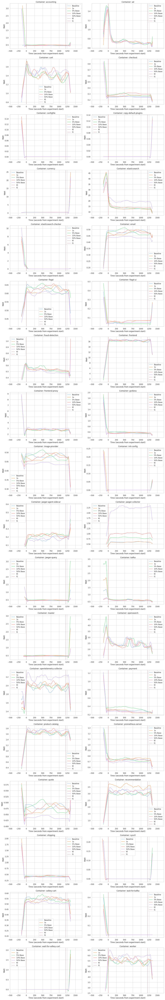

In [9]:

# Directory containing reports
report_directory = "reports/"
treatment_names = ["delay_treatment", "empty_treatment"]
#                       baseline                                    5% base                                                10% base                                                      50% base                                            1s
report_names = [experiments_map["recommendation_k8_base_1m_otel"], experiments_map["recommendation_k8_base_5_percent"],   experiments_map["recommendation_k8_base_10_percent"],experiments_map["recommendation_k8_base_50_percent"], experiments_map["recommendation_k8_base_1s_otel"]]
REPORT_LABELS = {report_names[0]: "Baseline", report_names[1]: "5% Base",  report_names[2]: "10% Base",  report_names[3]: "50% Base", report_names[4]: "1s"}

response_name = "pods_kepler_joules_all"

cached_dataframes_kepler_pods, combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(cached_dataframes_kepler_pods, report_directory, response_name, treatment_names, report_names)

#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

plot_kepler_metrics_per_pod_seaborn(combined_df, response_name, treatment_end_time, treatment_start_time)

#plot_kepler_metrics_per_pod(report_directory, "recommendationservice_kepler_other_joules_all", treatment_names, report_names)



## DRAM

Seems like there are indicators that RAM energy usage is only enabled in server class CPUs. Therefore it is shown as 0 for the CPU I used (13th Gen Intel(R) Core(TM) i5-13500).

In [10]:
cached_dataframes_kepler_pods_dram = []

In [11]:

cached_dataframes_kepler_pods_dram, combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(cached_dataframes_kepler_pods_dram, report_directory, "pods_kepler_dram_joules_all", treatment_names, report_names)

#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

#plot_kepler_metrics_per_pod_seaborn(combined_df, "pods_kepler_dram_joules_all", treatment_end_time, treatment_start_time, container_key="container_name")




Loading dataframes from reports because cached dataframes are empty.
Found 0 interactions for report_2025-05-01_12-42-09.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_12-42-09.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_13-40-13.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_13-40-13.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_14-09-20.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_14-09-20.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_14-38-24.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_14-38-24.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_13-11-11.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_13-11-11.yaml and empty_treatment.


Loading dataframes from reports because cached dataframes are empty.
Found 0 interactions for report_2025-05-01_12-42-09.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_12-42-09.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_13-40-13.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_13-40-13.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_14-09-20.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_14-09-20.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_14-38-24.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_14-38-24.yaml and empty_treatment.
Found 0 interactions for report_2025-05-01_13-11-11.yaml and delay_treatment.
Found 1 interactions for report_2025-05-01_13-11-11.yaml and empty_treatment.


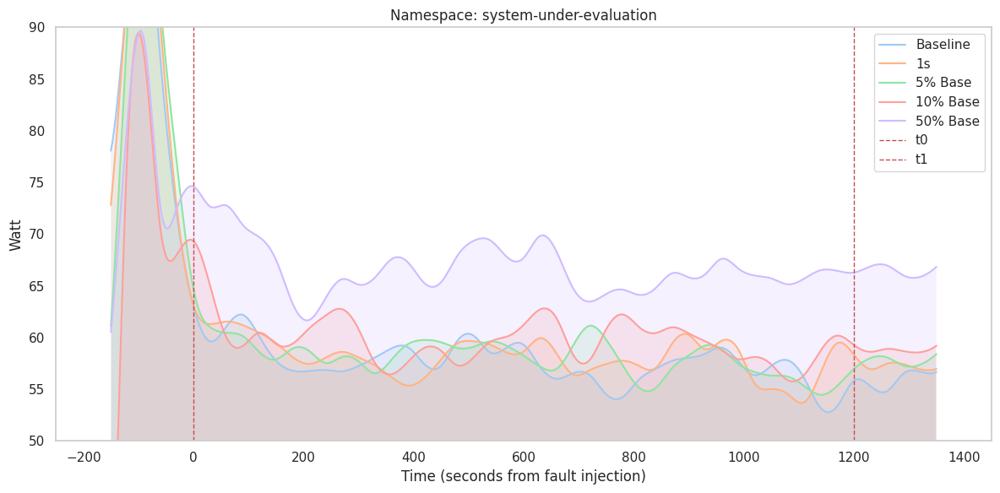

In [13]:
# uncomment to reset cache
cached_dataframes_kepler_namespace = []


response_name = "kepler_joules_namespace_combined"

#                       baseline                            delay 1m                            delay 1s                        5% base                         5% delay                                   10% base                             10% delay                     50% base                                    1s
#report_names = [experiments_map["recommendation_k8_base_1m_otel"], experiments_map["recommendation_k8_delay_1m_otel"], experiments_map["recommendation_k8_delay_1s_otel"], experiments_map["recommendation_k8_base_5_percent"],  experiments_map["recommendation_k8_delay_5_percent"], experiments_map["recommendation_k8_base_10_percent"], experiments_map["recommendation_k8_delay_10_percent"], experiments_map["recommendation_k8_base_50_percent"], experiments_map["recommendation_k8_base_1s_otel"]]
#REPORT_LABELS = {report_names[0]: "Baseline", report_names[1]: "Delay 1m", report_names[2]: "1s delay", report_names[3]: "5% Base", report_names[4]: "5% Delay", report_names[5]: "10% Base", report_names[6]: "10% Delay",  report_names[7]: "50% Base", report_names[8]: "1s"}

#                       baseline                                    5% base                                                10% base                                                      50% base                                            1s
report_names = [experiments_map["recommendation_k8_base_1m_otel"], experiments_map["recommendation_k8_base_5_percent"],   experiments_map["recommendation_k8_base_10_percent"],experiments_map["recommendation_k8_base_50_percent"], experiments_map["recommendation_k8_base_1s_otel"]]
REPORT_LABELS = {report_names[0]: "Baseline", report_names[1]: "5% Base",  report_names[2]: "10% Base",  report_names[3]: "50% Base", report_names[4]: "1s"}



cached_dataframes_kepler_namespace, combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(cached_dataframes_kepler_namespace, report_directory, response_name, treatment_names, report_names)




#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

#plot_kepler_metrics_per_pod(report_directory, "recommendationservice_kepler_other_joules_all", treatment_names, report_names)

#plot_kepler_metrics(combined_df, response_name, treatment_end_time, treatment_start_time, "system-under-evaluation")
plot_kepler_metrics_seaborn(combined_df, response_name, treatment_end_time, treatment_start_time, "system-under-evaluation")



## calculating power consumption per Pod

In [ ]:
# Directory containing reports
report_directory = "reports"

report_base = load_report_interactions(report_directory, report_names[0], "pods_kepler_joules_all_absolute", "empty_treatment")
report_delay = load_report_interactions(report_directory, report_names[1], "pods_kepler_joules_all_absolute", "delay_treatment")
report_delay_1s = load_report_interactions(report_directory, report_names[2], "pods_kepler_joules_all_absolute", "delay_treatment")
report_5percent = load_report_interactions(report_directory, report_names[3], "pods_kepler_joules_all_absolute", "empty_treatment")
report_5percent_delay = load_report_interactions(report_directory, report_names[4], "pods_kepler_joules_all_absolute", "delay_treatment")
report_10percent_base = load_report_interactions(report_directory, report_names[5], "pods_kepler_joules_all_absolute", "empty_treatment")
report_10percent_delay = load_report_interactions(report_directory, report_names[6], "pods_kepler_joules_all_absolute", "delay_treatment")
report_50percent_base = load_report_interactions(report_directory, report_names[7], "pods_kepler_joules_all_absolute", "empty_treatment")
report_base_1s = load_report_interactions(report_directory, report_names[8], "pods_kepler_joules_all_absolute", "empty_treatment")

Found 1 interactions for report_2025-05-01_12-42-09.yaml and empty_treatment.
Found 1 interactions for report_2025-05-01_14-38-24.yaml and empty_treatment.


IndexError: list index out of range

In [ ]:
def get_treatment_start_end(interaction, treatment_name):
    treatment_start_end_values = {}
    
    number_of_containers = len(interaction.response_data["container_name"].unique())
    #print(f"Interaction: {interaction.treatment_name} with {number_of_containers} containers")
    # Assuming `interaction.response_data` is your dataframe
    for container_name, df in interaction.response_data.groupby("container_name"):
        
        #print(f"Container: {container_name} - Treatment: {treatment_name}")
        # Filter for rows where treatment is "Treatment" and not NoTreatment
        treatment_df = df[df[treatment_name] == treatment_name]

        # cut off the first and last 10% of the data
        treatment_df = df.iloc[int(len(df) * 0.1):int(len(df) * 0.9)]
    
        
        if not treatment_df.empty:
            # TODO: use increase() in prometheus query instead of fixing it here
            # the values are normally monotonic increasing, but there are some exceptions where the values resets to 0 and starts again
            # so we have to check if each following value is greater than the previous one and if not, then we have to add the difference
            
            # Extract the column into a separate series to avoid chained assignment
            column = treatment_df["pods_kepler_joules_all_absolute"].copy()

            # Iterate through the series to fix monotonicity
            for i in range(1, len(column)):
                if column.iloc[i] < column.iloc[i - 1]:
                    print(f"Container: {container_name}, Found break in monotonicity at index {i}. Fixing it.")
                    # Calculate the difference and propagate it to all subsequent values
                    difference = column.iloc[i - 1] - column.iloc[i]
                    column.iloc[i:] += difference

            # Assign the fixed series back to the DataFrame
            treatment_df["pods_kepler_joules_all_absolute"] = column


           # get the first and last value of the treatment
            treatment_start = treatment_df["pods_kepler_joules_all_absolute"].iloc[0]
            treatment_end = treatment_df["pods_kepler_joules_all_absolute"].iloc[-1]
            
            
            difference = treatment_end - treatment_start
            time_difference = treatment_df.index[-1] - treatment_df.index[0]
            
            
            treatment_start_end_values[container_name] = (treatment_start, treatment_end, difference, time_difference)
            
            #print(f"Container: {container_name}, Treatment start: {treatment_start}, Treatment end: {treatment_end}")
            #print(f"Difference: {difference}")
            if difference < 0:
                print(f"Container: {container_name}, Negative difference found.")
        else:
            print(f"Container: {container_name}, No 'Treatment' period found.")

    return treatment_start_end_values



def modify_treatment(report, report_name, treatment_name):
    """if report:
        # Add treatment information to the DataFrame
        report.response_data["treatment"] = f"{report_name}_{treatment_name}"
        report.response_data["treatment_start"] = report.treatment_start
        report.response_data["treatment_end"] = report.treatment_end """
    return report


# Example usage
treatment_start_end = {}

report_base_interaction_modified = modify_treatment(report_base, report_names[0], "empty_treatment")
report_delay_interaction_modified = modify_treatment(report_delay, report_names[1], "delay_treatment")
report_delay_1s_interaction_modified = modify_treatment(report_delay_1s, report_names[2], "delay_treatment")
report_5percent_interaction_modified = modify_treatment(report_5percent, report_names[3], "empty_treatment")
report_5percent_delay_interaction_modified = modify_treatment(report_5percent_delay, report_names[4], "delay_treatment")
report_10percent_base_interaction_modified = modify_treatment(report_10percent_base, report_names[5], "empty_treatment")
report_10percent_delay_interaction_modified = modify_treatment(report_10percent_delay, report_names[6], "delay_treatment")
report_50percent_base_interaction_modified = modify_treatment(report_50percent_base, report_names[7], "empty_treatment")
report_1s_base_interaction_modified = modify_treatment(report_base_1s, report_names[8], "empty_treatment")

treatment_start_end_base = get_treatment_start_end(report_base_interaction_modified, "empty_treatment")
treatment_start_end_delay = get_treatment_start_end(report_delay_interaction_modified, "delay_treatment")
treatment_start_end_delay_1s = get_treatment_start_end(report_delay_1s_interaction_modified, "delay_treatment")
treatment_start_end_5percent = get_treatment_start_end(report_5percent_interaction_modified, "empty_treatment")
treatment_start_end_5percent_delay = get_treatment_start_end(report_5percent_delay_interaction_modified, "delay_treatment")
treatment_start_end_10percent_base = get_treatment_start_end(report_10percent_base_interaction_modified, "empty_treatment")
treatment_start_end_10percent_delay = get_treatment_start_end(report_10percent_delay_interaction_modified, "delay_treatment")
treatment_start_end_50percent_base = get_treatment_start_end(report_50percent_base_interaction_modified, "empty_treatment")
treatment_start_end_base_1s = get_treatment_start_end(report_1s_base_interaction_modified, "empty_treatment")

for container_name, values in treatment_start_end_base.items():
    percentage_differece_delay = (treatment_start_end_delay[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percentage_differece_delay_1s = (treatment_start_end_delay_1s[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percentage_differece_5percent = (treatment_start_end_5percent[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percecntage_differece_5percent_delay = (treatment_start_end_5percent_delay[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percentage_difference_10percent_base = (treatment_start_end_10percent_base[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percentage_differece_10percent_delay = (treatment_start_end_10percent_delay[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percentage_difference_50percent_base = (treatment_start_end_50percent_base[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    percentage_difference_base_1s = (treatment_start_end_base_1s[container_name][2] - treatment_start_end_base[container_name][2]) / treatment_start_end_base[container_name][2] * 100
    print(f"Container: {container_name}")
    print(f"Base Treatment: {treatment_start_end_base[container_name][2]} over {treatment_start_end_base[container_name][3]}")
    print(f"Delay Treatment: {treatment_start_end_delay[container_name][2]} ({percentage_differece_delay:.2f}%) over {treatment_start_end_delay[container_name][3]}")
    print(f"1s Treatment: {treatment_start_end_base_1s[container_name][2]} ({percentage_difference_base_1s:.2f}%) over {treatment_start_end_base_1s[container_name][3]}")
    print(f"Delay 1s Treatment: {treatment_start_end_delay_1s[container_name][2]} ({percentage_differece_delay_1s:.2f}%) over {treatment_start_end_delay_1s[container_name][3]}")
    print(f"5% Treatment: {treatment_start_end_5percent[container_name][2]} ({percentage_differece_5percent:.2f}%) over {treatment_start_end_5percent[container_name][3]}")
    print(f"5% Delay Treatment: {treatment_start_end_5percent_delay[container_name][2]} ({percecntage_differece_5percent_delay:.2f}%) over {treatment_start_end_5percent_delay[container_name][3]}")
    print(f"10% Treatment: {treatment_start_end_10percent_base[container_name][2]} ({percentage_difference_10percent_base:.2f}%) over {treatment_start_end_10percent_base[container_name][3]}")
    print(f"10% Delay Treatment: {treatment_start_end_10percent_delay[container_name][2]} ({percentage_differece_10percent_delay:.2f}%) over {treatment_start_end_10percent_delay[container_name][3]}")
    print(f"50% Treatment: {treatment_start_end_50percent_base[container_name][2]} ({percentage_difference_50percent_base:.2f}%) over {treatment_start_end_50percent_base[container_name][3]}")
    print("-----------------------------------------------")
        
base_sum = sum([treatment_start_end_base[container_name][2] for container_name in treatment_start_end_base])
delay_sum = sum([treatment_start_end_delay[container_name][2] for container_name in treatment_start_end_delay])
delay_1s_sum = sum([treatment_start_end_delay_1s[container_name][2] for container_name in treatment_start_end_delay_1s])
percent_5_sum = sum([treatment_start_end_5percent[container_name][2] for container_name in treatment_start_end_5percent])
percent_5_delay_sum = sum([treatment_start_end_5percent_delay[container_name][2] for container_name in treatment_start_end_5percent_delay])
percent_10_sum = sum([treatment_start_end_10percent_base[container_name][2] for container_name in treatment_start_end_10percent_base])
percent_10_delay_sum = sum([treatment_start_end_10percent_delay[container_name][2] for container_name in treatment_start_end_10percent_delay])
percent_50_sum = sum([treatment_start_end_50percent_base[container_name][2] for container_name in treatment_start_end_50percent_base])
percent_1s_sum = sum([treatment_start_end_base_1s[container_name][2] for container_name in treatment_start_end_base_1s])

print(f"All containers:")
print(f"Base Treatment: {base_sum}")
print(f"Delay Treatment: {delay_sum} ({(delay_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"1s Treatment: {percent_1s_sum} ({(percent_1s_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"Delay 1s Treatment: {delay_1s_sum} ({(delay_1s_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"5% Treatment: {percent_5_sum} ({(percent_5_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"5% Delay Treatment: {percent_5_delay_sum} ({(percent_5_delay_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"10% Treatment: {percent_10_sum} ({(percent_10_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"10% Delay Treatment: {percent_10_delay_sum} ({(percent_10_delay_sum - base_sum) / base_sum * 100:.2f}%)")
print(f"50% Treatment: {percent_50_sum} ({(percent_50_sum - base_sum) / base_sum * 100:.2f}%)")
print("-----------------------------------------------")

# calc median, average and percentlies of all containers

base_values = [treatment_start_end_base[container_name][2] for container_name in treatment_start_end_base]
delay_values = [treatment_start_end_delay[container_name][2] for container_name in treatment_start_end_delay]
base_1s_values = [treatment_start_end_base_1s[container_name][2] for container_name in treatment_start_end_base_1s]
delay_1s_values = [treatment_start_end_delay_1s[container_name][2] for container_name in treatment_start_end_delay_1s]
percent_5_values = [treatment_start_end_5percent[container_name][2] for container_name in treatment_start_end_5percent]
percent_5_delay_values = [treatment_start_end_5percent_delay[container_name][2] for container_name in treatment_start_end_5percent_delay]
percent_10_values = [treatment_start_end_10percent_base[container_name][2] for container_name in treatment_start_end_10percent_base]
percent_10_delay_values = [treatment_start_end_10percent_delay[container_name][2] for container_name in treatment_start_end_10percent_delay]
percent_50_values = [treatment_start_end_50percent_base[container_name][2] for container_name in treatment_start_end_50percent_base]


print(f"Base Treatment: Median: {np.median(base_values)}, Average: {np.mean(base_values)}, 90th percentile: {np.percentile(base_values, 90)}")
print(f"Delay Treatment: Median: {np.median(delay_values)}, Average: {np.mean(delay_values)}, 90th percentile: {np.percentile(delay_values, 90)}")
print(f"1s Treatment: Median: {np.median(base_1s_values)}, Average: {np.mean(base_1s_values)}, 90th percentile: {np.percentile(base_1s_values, 90)}")
print(f"Delay 1s Treatment: Median: {np.median(delay_1s_values)}, Average: {np.mean(delay_1s_values)}, 90th percentile: {np.percentile(delay_1s_values, 90)}")
print(f"5% Treatment: Median: {np.median(percent_5_values)}, Average: {np.mean(percent_5_values)}, 90th percentile: {np.percentile(percent_5_values, 90)}")
print(f"5% Delay Treatment: Median: {np.median(percent_5_delay_values)}, Average: {np.mean(percent_5_delay_values)}, 90th percentile: {np.percentile(percent_5_delay_values, 90)}")
print(f"10% Treatment: Median: {np.median(percent_10_values)}, Average: {np.mean(percent_10_values)}, 90th percentile: {np.percentile(percent_10_values, 90)}")
print(f"10% Delay Treatment: Median: {np.median(percent_10_delay_values)}, Average: {np.mean(percent_10_delay_values)}, 90th percentile: {np.percentile(percent_10_delay_values, 90)}")
print(f"50% Treatment: Median: {np.median(percent_50_values)}, Average: {np.mean(percent_50_values)}, 90th percentile: {np.percentile(percent_50_values, 90)}")

print("-----------------------------------------------")

# variance and error
print(f"Base Treatment: Variance: {np.var(base_values)}, Standard deviation: {np.std(base_values)}, Standard error: {np.std(base_values) / np.sqrt(len(base_values))}")
print(f"Delay Treatment: Variance: {np.var(delay_values)}, Standard deviation: {np.std(delay_values)}, Standard error: {np.std(delay_values) / np.sqrt(len(delay_values))}")
print(f"1s Treatment: Variance: {np.var(base_1s_values)}, Standard deviation: {np.std(base_1s_values)}, Standard error: {np.std(base_1s_values) / np.sqrt(len(base_1s_values))}")
print(f"Delay 1s Treatment: Variance: {np.var(delay_1s_values)}, Standard deviation: {np.std(delay_1s_values)}, Standard error: {np.std(delay_1s_values) / np.sqrt(len(delay_1s_values))}")
print(f"5% Treatment: Variance: {np.var(percent_5_values)}, Standard deviation: {np.std(percent_5_values)}, Standard error: {np.std(percent_5_values) / np.sqrt(len(percent_5_values))}")
print(f"5% Delay Treatment: Variance: {np.var(percent_5_delay_values)}, Standard deviation: {np.std(percent_5_delay_values)}, Standard error: {np.std(percent_5_delay_values) / np.sqrt(len(percent_5_delay_values))}")
print(f"10% Treatment: Variance: {np.var(percent_10_values)}, Standard deviation: {np.std(percent_10_values)}, Standard error: {np.std(percent_10_values) / np.sqrt(len(percent_10_values))}")
print(f"10% Delay Treatment: Variance: {np.var(percent_10_delay_values)}, Standard deviation: {np.std(percent_10_delay_values)}, Standard error: {np.std(percent_10_delay_values) / np.sqrt(len(percent_10_delay_values))}")
print(f"50% Treatment: Variance: {np.var(percent_50_values)}, Standard deviation: {np.std(percent_50_values)}, Standard error: {np.std(percent_50_values) / np.sqrt(len(percent_50_values))}")


print("-----------------------------------------------")

# in kWh
base_sum_kwh = base_sum / 3600000
base_1s_sum_kwh = percent_1s_sum / 3600000
percent_10_sum_kwh = percent_10_sum / 3600000
percent_50_sum_kwh = percent_50_sum / 3600000

print(f"Base Treatment: {base_sum_kwh} kWh")
print(f"1s Treatment: {base_1s_sum_kwh} kWh")
print(f"10% Treatment: {percent_10_sum_kwh} kWh")
print(f"50% Treatment: {percent_50_sum_kwh} kWh")


Container: accountingservice
Base Treatment: 892.3199999999999 over 0 days 00:20:00
Delay Treatment: 840.1769999999999 (-5.84%) over 0 days 00:20:00
1s Treatment: 844.7309999999999 (-5.33%) over 0 days 00:20:00
Delay 1s Treatment: 841.785 (-5.66%) over 0 days 00:20:00
5% Treatment: 853.5060000000001 (-4.35%) over 0 days 00:20:00
5% Delay Treatment: 847.923 (-4.98%) over 0 days 00:20:00
10% Treatment: 855.939 (-4.08%) over 0 days 00:20:00
10% Delay Treatment: 855.927 (-4.08%) over 0 days 00:20:00
50% Treatment: 903.789 (1.29%) over 0 days 00:20:00
-----------------------------------------------
Container: adservice
Base Treatment: 1024.6889999999999 over 0 days 00:20:00
Delay Treatment: 969.8430000000001 (-5.35%) over 0 days 00:20:00
1s Treatment: 973.5540000000001 (-4.99%) over 0 days 00:20:00
Delay 1s Treatment: 971.8889999999999 (-5.15%) over 0 days 00:20:00
5% Treatment: 979.0920000000001 (-4.45%) over 0 days 00:20:00
5% Delay Treatment: 992.277 (-3.16%) over 0 days 00:20:00
10% Tre

/tmp/ipykernel_424345/233438589.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  treatment_df["pods_kepler_joules_all_absolute"] = column
/tmp/ipykernel_424345/233438589.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  treatment_df["pods_kepler_joules_all_absolute"] = column
/tmp/ipykernel_424345/233438589.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

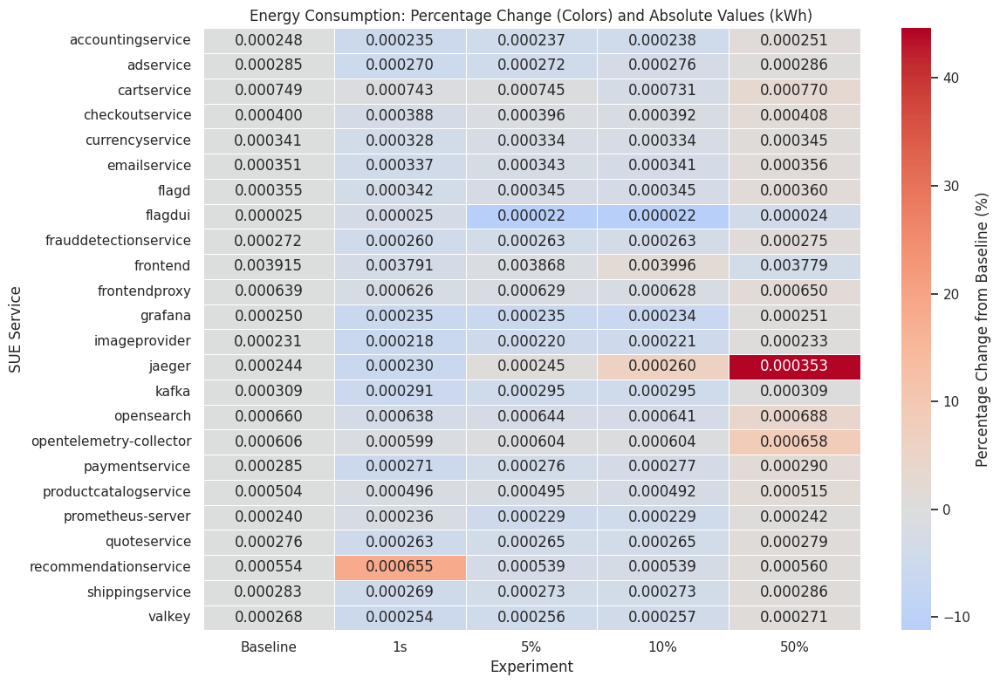

                          Baseline         1s         5%        10%        50%
accountingservice          892.320    844.731    853.506    855.939    903.789
adservice                 1024.689    973.554    979.092    992.847   1031.091
cartservice               2697.627   2673.291   2683.632   2632.800   2772.942
checkoutservice           1440.744   1396.344   1424.781   1411.254   1467.741
configfile                   0.000      0.000      0.000      0.000      0.000
currencyservice           1227.930   1181.550   1202.661   1201.047   1242.711
emailservice              1263.972   1214.598   1236.213   1227.045   1281.612
flagd                     1276.632   1232.358   1243.260   1241.964   1295.145
flagdui                     90.981     88.395     80.808     80.775     87.405
frauddetectionservice      978.180    936.198    945.234    945.813    991.029
frontend                 14093.892  13646.142  13923.147  14386.950  13602.600
frontendproxy             2299.578   2251.947   2265

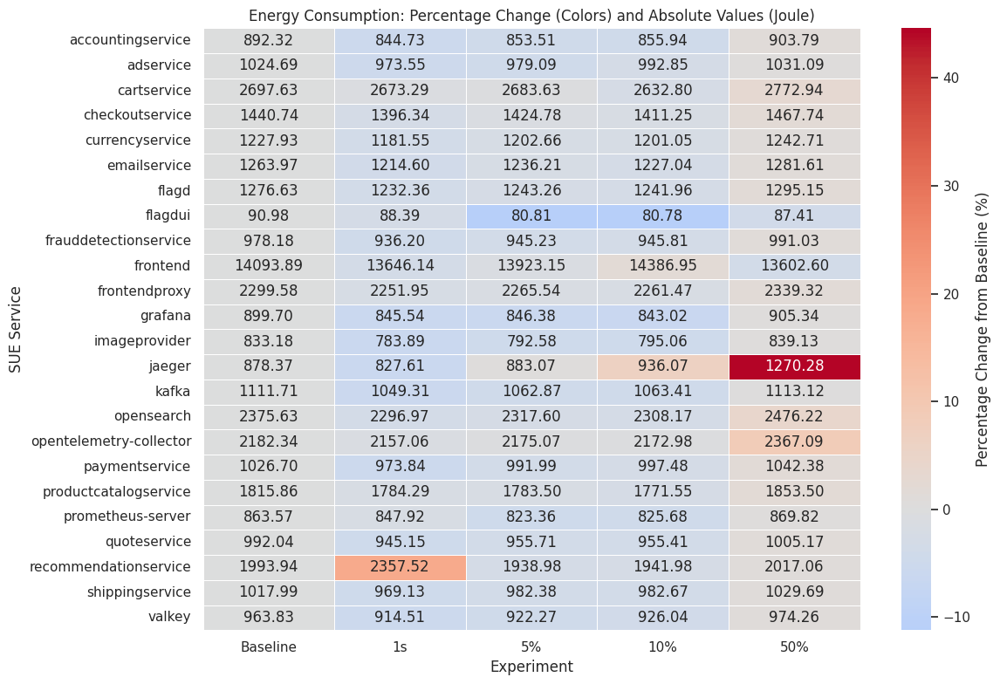

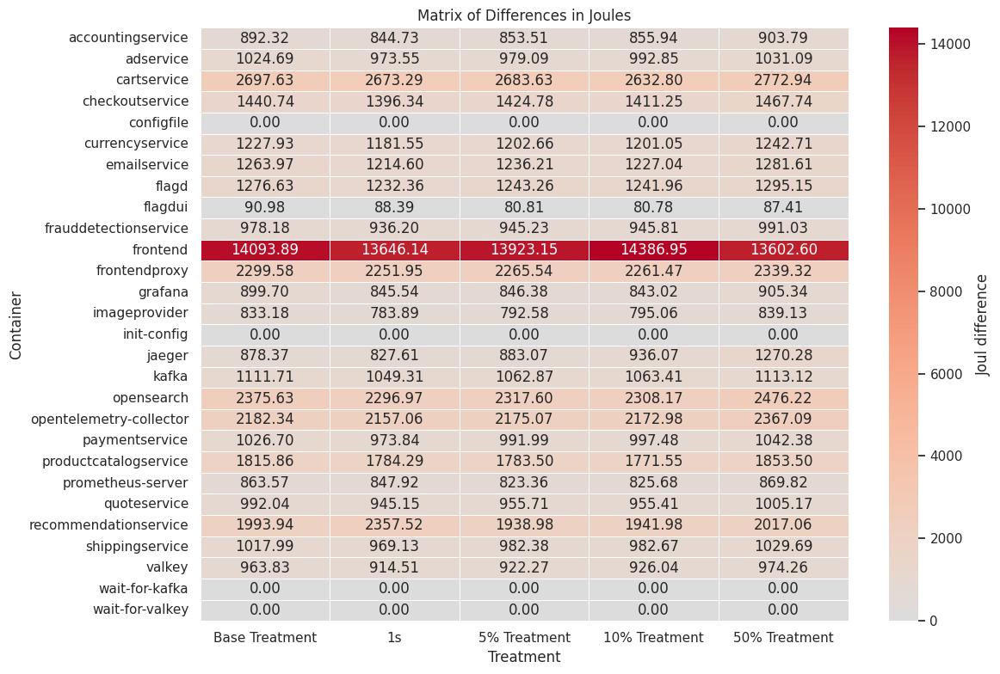

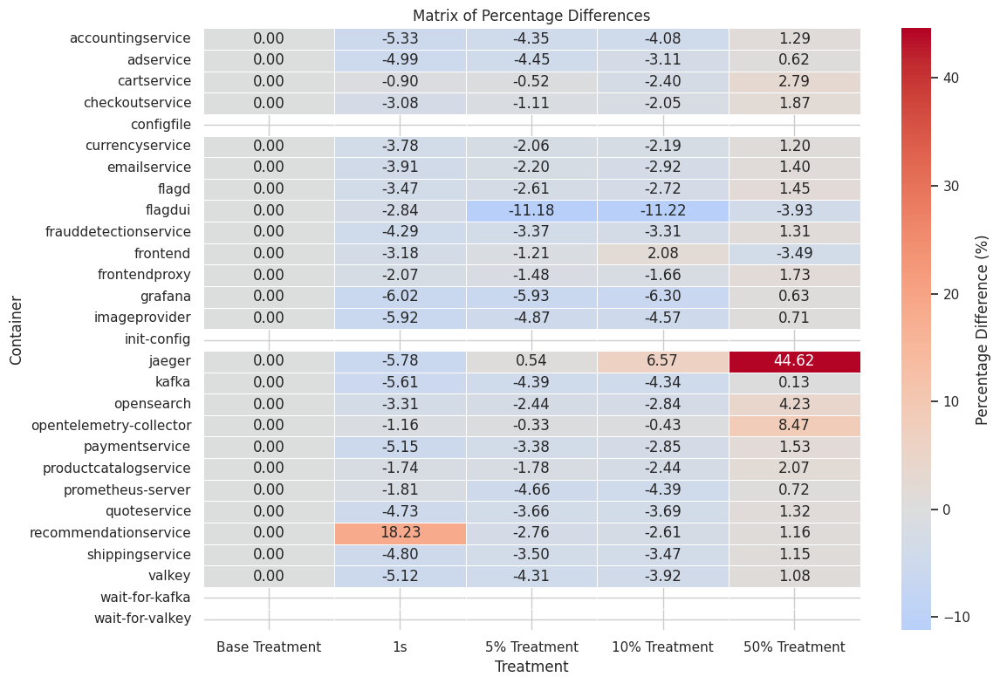

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def generate_difference_matrix_percentage(
    treatment_start_end_base, 
    treatment_start_end_delay, 
    treatment_start_end_1s,
    treatment_start_end_delay_1s, 
    treatment_start_end_5percent, 
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
    ):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Base Treatment": [treatment_start_end_base[c][2] for c in containers],
        #"Delay Treatment": [treatment_start_end_delay[c][2] for c in containers],
        "1s": [treatment_start_end_1s[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_5percent_delay],
        #"Delay 1s Treatment": [treatment_start_end_delay_1s[c][2] for c in containers],
        "5% Treatment": [treatment_start_end_5percent[c][2] for c in containers],
        #"5% Delay Treatment": [treatment_start_end_5percent_delay[c][2] for c in containers],
        "10% Treatment": [treatment_start_end_10percent_base[c][2] for c in containers],
        #"10% Delay Treatment": [treatment_start_end_10percent_delay[c][2] for c in containers],
        "50% Treatment": [treatment_start_end_50percent_base[c][2] for c in containers]
    }

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)

    # Calculate percentage differences relative to the base treatment
    percentage_difference = df.copy()
    for col in data.keys():
        percentage_difference[col] = (df[col] - df["Base Treatment"]) / df["Base Treatment"] * 100

    # Drop the base column from the percentage difference DataFrame
    #percentage_difference.drop(columns=["Base Treatment"], inplace=True)

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_difference,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Percentage Difference (%)'}
    )
    plt.title("Matrix of Percentage Differences")
    plt.xlabel("Treatment")
    plt.ylabel("Container")
    plt.tight_layout()
    plt.show()

def generate_difference_matrix(
    treatment_start_end_base, 
    treatment_start_end_delay, 
    treatment_start_end_1s,
    treatment_start_end_delay_1s, 
    treatment_start_end_5percent, 
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base, 
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
    ):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Base Treatment": [treatment_start_end_base[c][2] for c in containers],
        #"Delay Treatment": [treatment_start_end_delay[c][2] for c in containers],
        "1s": [treatment_start_end_1s[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_5percent_delay],
        #"Delay 1s Treatment": [treatment_start_end_delay_1s[c][2] for c in containers],
        "5% Treatment": [treatment_start_end_5percent[c][2] for c in containers],
        #"5% Delay Treatment": [treatment_start_end_5percent_delay[c][2] for c in containers],
        "10% Treatment": [treatment_start_end_10percent_base[c][2] for c in containers],
        #"10% Delay Treatment": [treatment_start_end_10percent_delay[c][2] for c in containers],
        "50% Treatment": [treatment_start_end_50percent_base[c][2] for c in containers]
    }

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)

    # Calculate percentage differences relative to the base treatment
    percentage_difference = df.copy()
    for col in data.keys():
        percentage_difference[col] = df[col]

    # Drop the base column from the percentage difference DataFrame
    #percentage_difference.drop(columns=["Base Treatment"], inplace=True)

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_difference,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Joul difference'}
    )
    plt.title("Matrix of Differences in Joules")
    plt.xlabel("Treatment")
    plt.ylabel("Container")
    plt.tight_layout()
    plt.show()

def generate_difference_matrix_baseline(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_1s,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_delay_5percent,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Baseline": [treatment_start_end_base[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        #"Delay": [treatment_start_end_delay[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        "1s": [treatment_start_end_1s[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        #"Delay 1s": [treatment_start_end_delay_1s[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        "5%": [treatment_start_end_5percent[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        #"Delay 5% ": [treatment_start_end_delay_5percent[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent],
        "10%": [treatment_start_end_10percent_base[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent],
        #"Delay 10%": [treatment_start_end_10percent_delay[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent],
        "50%": [treatment_start_end_50percent_base[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent]
    }

    for c in containers:
        if c not in treatment_start_end_delay or c not in treatment_start_end_delay_1s or c not in treatment_start_end_5percent:
            print(f"Container {c} not found in all treatments. removing from list.")
            containers.remove(c)
            continue

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)


    # Compute percentage changes relative to "Baseline"
    percentage_changes = df.subtract(df["Baseline"], axis=0).div(df["Baseline"], axis=0) * 100

    # Compute absolute differences (to show as annotations)
    absolute_difference = df.subtract(df["Baseline"], axis=0)

    #print(percentage_changes)
    print(df)
    
    df = df #/ (3600 * 1000) # convert to kWh

    #check if there are any infinite values 
    for col in percentage_changes.columns:
        for i in range(len(percentage_changes[col])):
            if math.isinf(percentage_changes[col].iloc[i]):
                print(f"NaN found in {col} {i} with value {percentage_changes[col].iloc[i]} for original values {df[col].iloc[i]} and {df['Baseline'].iloc[i]}")
                percentage_changes.loc[containers[i], col] = math.nan
    

    percentage_changes = percentage_changes.dropna()
    df = [df.loc[container] for container in percentage_changes.index]
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_changes,  # Percentage changes determine the colors
        annot=df,  # Absolutes are shown as annotations
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Percentage Change from Baseline (%)'}
    )
    plt.title("Energy Consumption: Percentage Change (Colors) and Absolute Values (Joule)")
    plt.xlabel("Experiment")
    plt.ylabel("SUE Service")
    plt.tight_layout()
    plt.savefig("evaluation/plots/energy_consumption_heatmap.png")
    plt.show()
    
def generate_difference_matrix_baseline_kwh(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_1s,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_delay_5percent,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Baseline": [treatment_start_end_base[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        #"Delay": [treatment_start_end_delay[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        "1s": [treatment_start_end_1s[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        #"Delay 1s": [treatment_start_end_delay_1s[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        "5%": [treatment_start_end_5percent[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent and c in treatment_start_end_delay_5percent],
        #"Delay 5% ": [treatment_start_end_delay_5percent[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent],
        "10%": [treatment_start_end_10percent_base[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent],
        #"Delay 10%": [treatment_start_end_10percent_delay[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent],
        "50%": [treatment_start_end_50percent_base[c][2] for c in containers if c in treatment_start_end_delay and c in treatment_start_end_delay_1s and c in treatment_start_end_5percent]
    }

    for c in containers:
        if c not in treatment_start_end_delay or c not in treatment_start_end_delay_1s or c not in treatment_start_end_5percent:
            print(f"Container {c} not found in all treatments. removing from list.")
            containers.remove(c)
            continue

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)


    # Compute percentage changes relative to "Baseline"
    percentage_changes = df.subtract(df["Baseline"], axis=0).div(df["Baseline"], axis=0) * 100

    # Compute absolute differences (to show as annotations)
    absolute_difference = df.subtract(df["Baseline"], axis=0)

    #print(percentage_changes)
    #print(df)
    
    df = df #/ (3600 * 1000) # convert to kWh

    #check if there are any infinite values 
    for col in percentage_changes.columns:
        for i in range(len(percentage_changes[col])):
            if math.isinf(percentage_changes[col].iloc[i]):
                print(f"NaN found in {col} {i} with value {percentage_changes[col].iloc[i]} for original values {df[col].iloc[i]} and {df['Baseline'].iloc[i]}")
                percentage_changes.loc[containers[i], col] = math.nan
    
    df_wh = df / 3600
    df_kwh = df / (3600 * 1000) # convert to kWh
    

    # remove empty containers
    percentage_changes = percentage_changes.dropna()
    df_wh = [df_wh.loc[container] for container in percentage_changes.index]
    df_kwh = [df_kwh.loc[container] for container in percentage_changes.index]

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_changes,  # Percentage changes determine the colors
        annot=df_kwh,  # Absolutes are shown as annotations
        fmt=".6f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Percentage Change from Baseline (%)'}
    )
    plt.title("Energy Consumption: Percentage Change (Colors) and Absolute Values (kWh)")
    plt.xlabel("Experiment")
    plt.ylabel("SUE Service")
    plt.tight_layout()
    plt.savefig("evaluation/plots/energy_consumption_heatmap_kwh.png")
    plt.show()

generate_difference_matrix_baseline_kwh(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_base_1s,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base   
)

generate_difference_matrix_baseline(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_base_1s,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
)

generate_difference_matrix(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_base_1s,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
)

generate_difference_matrix_percentage(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_base_1s,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay,
    treatment_start_end_50percent_base
)


                          Baseline  5% No Treatment
accountingservice          892.320          853.506
adservice                 1024.689          979.092
cartservice               2697.627         2683.632
checkoutservice           1440.744         1424.781
configfile                   0.000            0.000
currencyservice           1227.930         1202.661
emailservice              1263.972         1236.213
flagd                     1276.632         1243.260
flagdui                     90.981           80.808
frauddetectionservice      978.180          945.234
frontend                 14093.892        13923.147
frontendproxy             2299.578         2265.540
grafana                    899.700          846.378
imageprovider              833.181          792.576
init-config                  0.000            0.000
jaeger                     878.370          883.071
kafka                     1111.710         1062.870
opensearch                2375.634         2317.596
opentelemetr

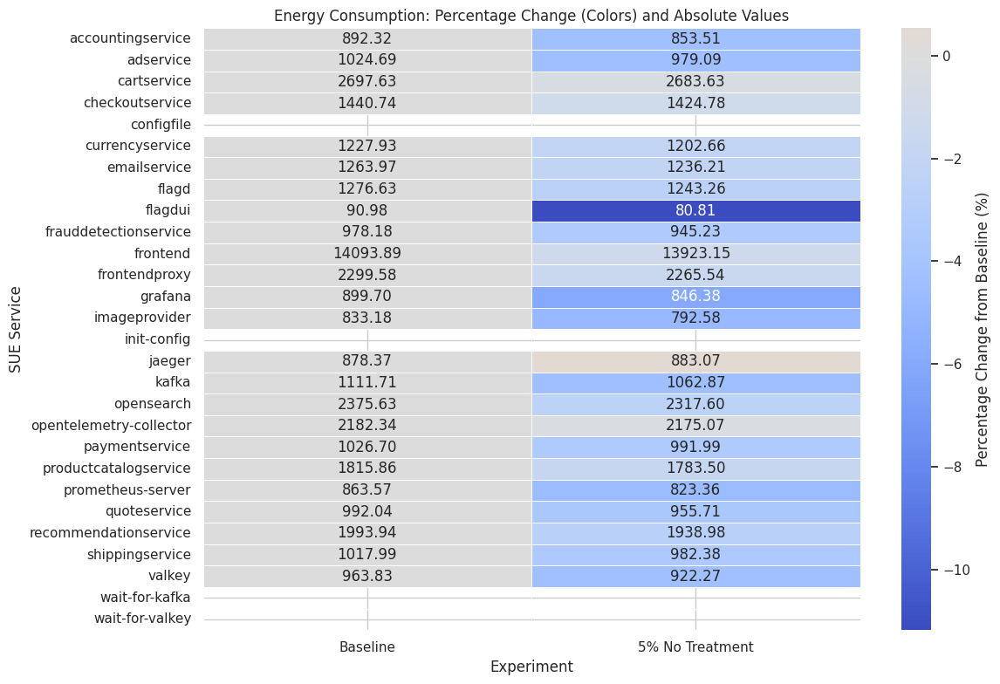

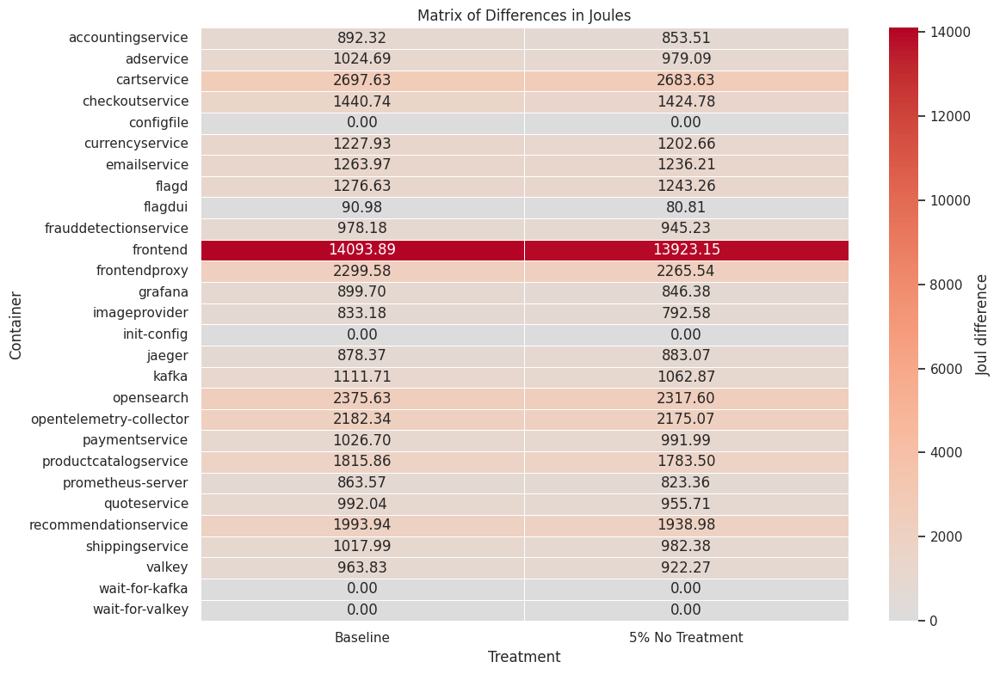

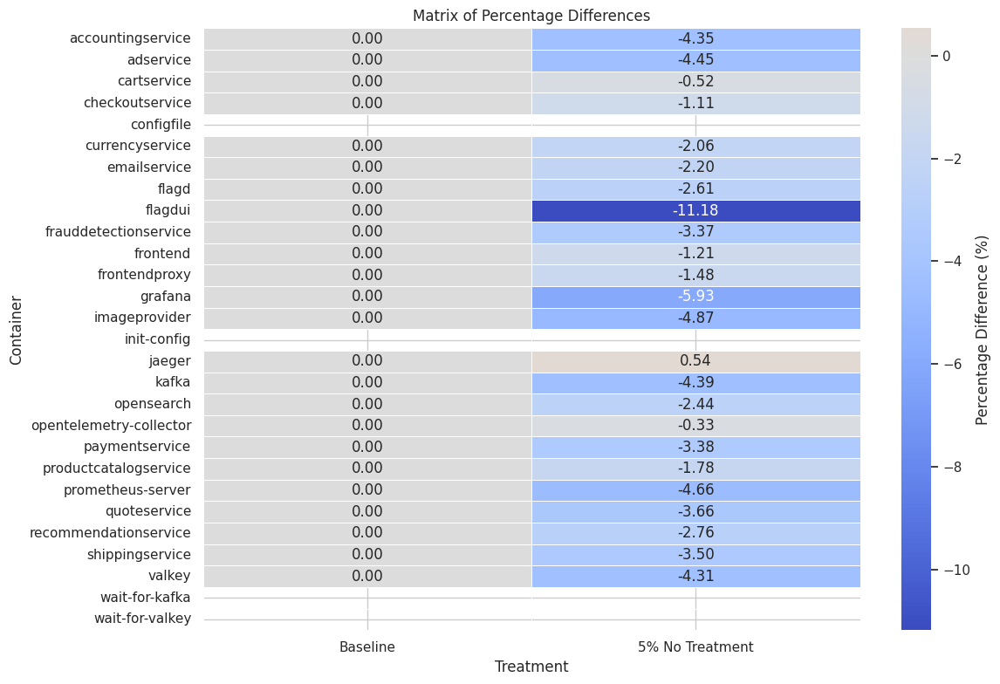

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def generate_difference_matrix_percentage(
    treatment_start_end_base, 
    treatment_start_end_delay, 
    treatment_start_end_delay_1s, 
    treatment_start_end_5percent, 
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay
    ):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Baseline": [treatment_start_end_base[c][2] for c in containers],
        "5% No Treatment": [treatment_start_end_5percent[c][2] for c in containers],
    }

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)

    # Calculate percentage differences relative to the base treatment
    percentage_difference = df.copy()
    for col in ["Baseline", "5% No Treatment"]:
        percentage_difference[col] = (df[col] - df["Baseline"]) / df["Baseline"] * 100

    # Drop the base column from the percentage difference DataFrame
    #percentage_difference.drop(columns=["Base Treatment"], inplace=True)

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_difference,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Percentage Difference (%)'}
    )
    plt.title("Matrix of Percentage Differences")
    plt.xlabel("Treatment")
    plt.ylabel("Container")
    plt.tight_layout()
    plt.show()

def generate_difference_matrix(
    treatment_start_end_base, 
    treatment_start_end_delay, 
    treatment_start_end_delay_1s, 
    treatment_start_end_5percent, 
    treatment_start_end_5percent_delay,
    treatment_start_end_10percent_base, 
    treatment_start_end_10percent_delay
    ):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Baseline": [treatment_start_end_base[c][2] for c in containers],
        "5% No Treatment": [treatment_start_end_5percent[c][2] for c in containers],
    }

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)

    # Calculate percentage differences relative to the base treatment
    percentage_difference = df.copy()
    for col in ["Baseline", "5% No Treatment"]:
        percentage_difference[col] = df[col]

    # Drop the base column from the percentage difference DataFrame
    #percentage_difference.drop(columns=["Base Treatment"], inplace=True)

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_difference,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Joul difference'}
    )
    plt.title("Matrix of Differences in Joules")
    plt.xlabel("Treatment")
    plt.ylabel("Container")
    plt.tight_layout()
    plt.show()

def generate_difference_matrix_baseline(
    treatment_start_end_base,
    treatment_start_end_delay,
    treatment_start_end_delay_1s,
    treatment_start_end_5percent,
    treatment_start_end_delay_5percent,
    treatment_start_end_10percent_base,
    treatment_start_end_10percent_delay
):
    # Prepare data for matrix
    containers = list(treatment_start_end_base.keys())
    data = {
        "Baseline": [treatment_start_end_base[c][2] for c in containers],
        "5% No Treatment": [treatment_start_end_5percent[c][2] for c in containers],
    }

    for c in containers:
        if c not in treatment_start_end_5percent:
            print(f"Container {c} not found in all treatments. removing from list.")
            containers.remove(c)
            continue

    # Create a DataFrame
    df = pd.DataFrame(data, index=containers)


    # Compute percentage changes relative to "Baseline"
    percentage_changes = df.subtract(df["Baseline"], axis=0).div(df["Baseline"], axis=0) * 100

    # Compute absolute differences (to show as annotations)
    absolute_difference = df.subtract(df["Baseline"], axis=0)

    #print(percentage_changes)
    print(df)
    
    df = df #/ (3600 * 1000) # convert to kWh

    #check if there are any infinite values 
    for col in percentage_changes.columns:
        for i in range(len(percentage_changes[col])):
            if math.isinf(percentage_changes[col].iloc[i]):
                print(f"NaN found in {col} {i} with value {percentage_changes[col].iloc[i]} for original values {df[col].iloc[i]} and {df['Baseline'].iloc[i]}")
                percentage_changes.loc[containers[i], col] = math.nan
    

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        percentage_changes,  # Percentage changes determine the colors
        annot=df,  # Absolutes are shown as annotations
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={'label': 'Percentage Change from Baseline (%)'}
    )
    plt.title("Energy Consumption: Percentage Change (Colors) and Absolute Values")
    plt.xlabel("Experiment")
    plt.ylabel("SUE Service")
    plt.tight_layout()
    plt.show()


generate_difference_matrix_baseline(
    treatment_start_end_base,
    None,
    None,
    treatment_start_end_5percent,
    None,
    None,
    None
)

generate_difference_matrix(
    treatment_start_end_base,
    None,
    None,
    treatment_start_end_5percent,
    None,
    None,
    None
)

generate_difference_matrix_percentage(
    treatment_start_end_base,
    None,
    None,
    treatment_start_end_5percent,
    None,
    None,
    None
)


## Compare Baselines

In [ ]:
cached_baseline_dataframes_kepler_pods = {}

Searching for most recent experiments in list of reports 9
Found 1 baseline experiments
Loading dataframes from reports because cached dataframes are empty.
Found 0 interactions for report_2025-03-12_11-58-33.yaml and delay_treatment.
Found 1 interactions for report_2025-03-12_11-58-33.yaml and empty_treatment.


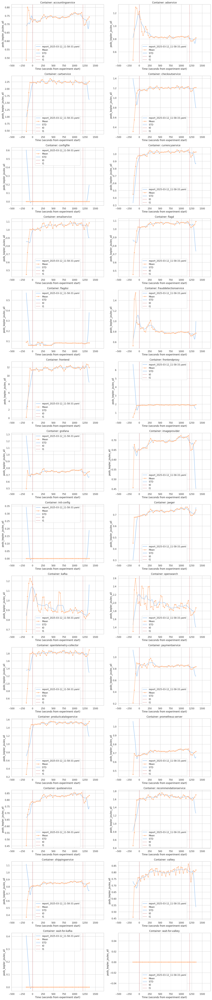

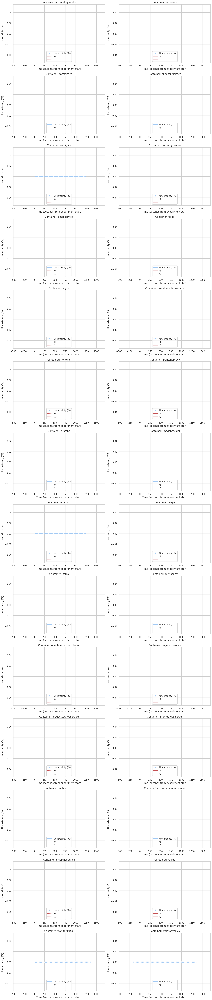

In [ ]:


baseline_experiment_list = []

# iterate over all reports and find a string in them
print("Searching for most recent experiments in list of reports " + len(files_in_direcotory).__str__())
for file in files_in_direcotory:
    report_path = path.join("reports", file)
    # read the file as a string
    with open(report_path, "r") as f:
        content = f.read()
        if "recommendation_k8_base_1m_otel" in content:
            baseline_experiment_list.append(file)

print("Found " + len(baseline_experiment_list).__str__() + " baseline experiments")


report_names = baseline_experiment_list

REPORT_LABELS = {}

for report in report_names:
    REPORT_LABELS[report] = report


#REPORT_LABELS = {report_names[0]: "Baseline", report_names[1]: "Delay 1m", report_names[2]: "1s delay", report_names[3]: "5% Base", report_names[4]: "5% Delay", report_names[5]: "10% Base", report_names[6]: "10% Delay",  report_names[7]: "50% Base", report_names[8]: "1s"}

response_name = "pods_kepler_joules_all"

cached_baseline_dataframes_kepler_pods, combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(cached_baseline_dataframes_kepler_pods, report_directory, response_name, treatment_names, report_names)

#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

plot_individual_and_aggregated(combined_df, response_name, treatment_end_time, treatment_start_time)

plot_percentage_uncertainty(combined_df, response_name, treatment_end_time, treatment_start_time)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math

def plot_std_and_mean(combined_df):
    # Optionally round the experiment_seconds to remove tiny differences
    combined_df['rounded_experiment_seconds'] = combined_df['experiment_seconds'].round(0)

    # Group by container and the rounded experiment_seconds
    grouped = (
        combined_df
        .groupby(['container_name', 'rounded_experiment_seconds'])['pods_kepler_joules_all']
        .agg(['mean', 'std'])
        .reset_index()
    )


        # Get unique container names
    container_names = combined_df['container_name'].unique()

    # Determine the grid size for subplots
    num_containers = len(container_names)
    num_cols = 2  # Define the number of columns for the grid
    num_rows = math.ceil(num_containers / num_cols)
    
    # Create subplots - one per container
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 6 * num_rows))
    axes = axes.flatten()
    # If there's only one subplot, wrap it in a list for consistent handling
    if num_containers == 1:
        axes = [axes]
    
    # Loop through each container and plot in its corresponding subplot
    for container, ax in zip(container_names, axes):
        container_data = grouped[grouped['container_name'] == container]
        
        # Plot the mean line with markers using seaborn
        sns.lineplot(
            x='rounded_experiment_seconds',
            y='mean',
            data=container_data,
            marker='o',
            ax=ax,
            label='Mean'
        )
        
        # Plot the standard deviation as a shaded area around the mean
        ax.fill_between(
            container_data['rounded_experiment_seconds'],
            container_data['mean'] - container_data['std'],
            container_data['mean'] + container_data['std'],
            alpha=0.3,
            label='STD'
        )
        
        ax.set_title(f'Mean and STD for {container}')
        ax.set_xlabel('Experiment Seconds (rounded)')
        ax.set_ylabel('pods_kepler_joules_all')
        ax.grid(True)
        ax.legend()
    
    plt.tight_layout()
    plt.show()

#plot_std_and_mean(combined_df)


## Compare 5% base

In [ ]:
cached_baseline_5_percent_dataframes_kepler_pods = {}

Searching for most recent experiments in list of reports 9
Found 1 baseline experiments
Loading dataframes from reports because cached dataframes are empty.
Found 0 interactions for report_2025-03-12_13-58-22.yaml and delay_treatment.
Found 1 interactions for report_2025-03-12_13-58-22.yaml and empty_treatment.


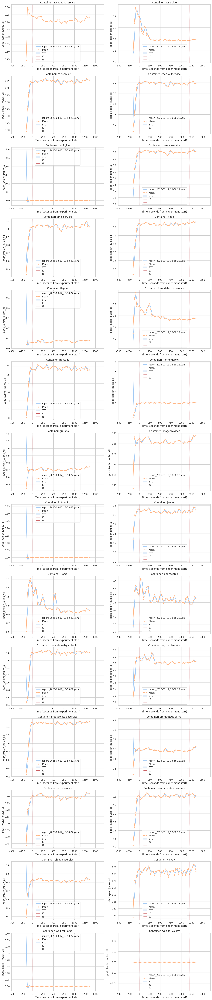

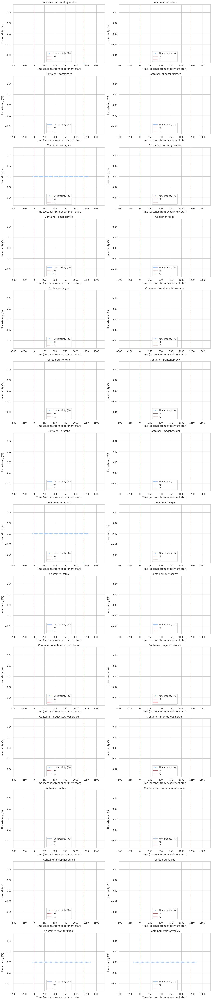

In [ ]:

baseline_experiment_list = []

# iterate over all reports and find a string in them
print("Searching for most recent experiments in list of reports " + len(files_in_direcotory).__str__())
for file in files_in_direcotory:
    report_path = path.join("reports", file)
    # read the file as a string
    with open(report_path, "r") as f:
        content = f.read()
        if "recommendation_k8_base_5_percent" in content:
            baseline_experiment_list.append(file)

print("Found " + len(baseline_experiment_list).__str__() + " baseline experiments")


report_names = baseline_experiment_list

REPORT_LABELS = {}

for report in report_names:
    REPORT_LABELS[report] = report


#REPORT_LABELS = {report_names[0]: "Baseline", report_names[1]: "Delay 1m", report_names[2]: "1s delay", report_names[3]: "5% Base", report_names[4]: "5% Delay", report_names[5]: "10% Base", report_names[6]: "10% Delay",  report_names[7]: "50% Base", report_names[8]: "1s"}

response_name = "pods_kepler_joules_all"

cached_baseline_5_percent_dataframes_kepler_pods, combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(cached_baseline_5_percent_dataframes_kepler_pods, report_directory, response_name, treatment_names, report_names)

#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

plot_individual_and_aggregated(combined_df, response_name, treatment_end_time, treatment_start_time, interpolation_kind="cubic", rolling_window=2)
plot_percentage_uncertainty(combined_df, response_name, treatment_end_time, treatment_start_time)

#plot_std_and_mean(combined_df)


In [ ]:
cached_baseline_50_percent_dataframes_kepler_pods = {}

Searching for most recent experiments in list of reports 9
Found 1 baseline experiments
Loading dataframes from reports because cached dataframes are empty.
Found 0 interactions for report_2025-03-12_15-58-39.yaml and delay_treatment.
Found 1 interactions for report_2025-03-12_15-58-39.yaml and empty_treatment.


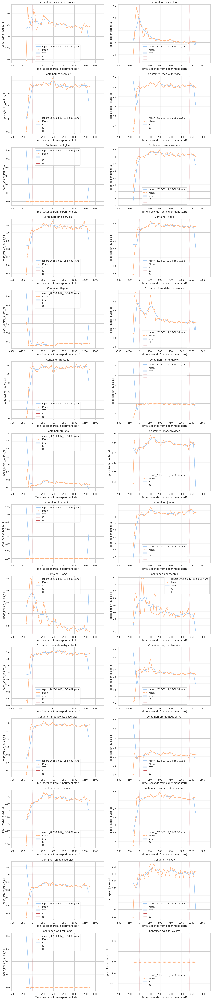

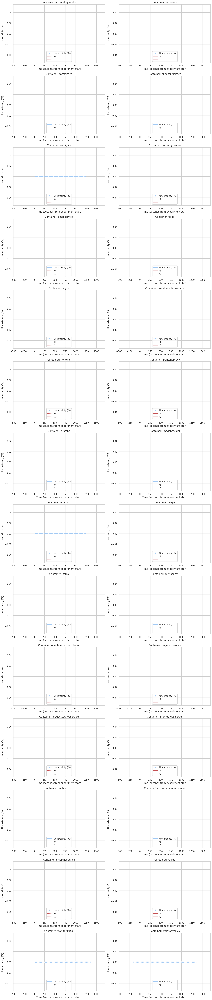

In [ ]:



baseline_experiment_list = []

# iterate over all reports and find a string in them
print("Searching for most recent experiments in list of reports " + len(files_in_direcotory).__str__())
for file in files_in_direcotory:
    report_path = path.join("reports", file)
    # read the file as a string
    with open(report_path, "r") as f:
        content = f.read()
        if "recommendation_k8_base_50_percent" in content:
            baseline_experiment_list.append(file)

print("Found " + len(baseline_experiment_list).__str__() + " baseline experiments")


report_names = baseline_experiment_list

REPORT_LABELS = {}

for report in report_names:
    REPORT_LABELS[report] = report


#REPORT_LABELS = {report_names[0]: "Baseline", report_names[1]: "Delay 1m", report_names[2]: "1s delay", report_names[3]: "5% Base", report_names[4]: "5% Delay", report_names[5]: "10% Base", report_names[6]: "10% Delay",  report_names[7]: "50% Base", report_names[8]: "1s"}

response_name = "pods_kepler_joules_all"

cached_baseline_50_percent_dataframes_kepler_pods, combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(cached_baseline_50_percent_dataframes_kepler_pods, report_directory, response_name, treatment_names, report_names)

#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

plot_individual_and_aggregated(combined_df, response_name, treatment_end_time, treatment_start_time)
plot_percentage_uncertainty(combined_df, response_name, treatment_end_time, treatment_start_time)
#plot_std_and_mean(combined_df)


# Mean Calculations

> Work in progress

In [ ]:
def mean_of_experiments_of_type(dataframes, response_name, container_key='container_name'):
    """     print(dataframes)
        #print(dataframes.columns) AttributeError: 'list' object has no attribute 'columns'
        print(dataframes[0])
        print(dataframes[0].columns)
        for df in dataframes:
            combined_df = pd.concat(dataframes, ignore_index=True)
        print(combined_df)
        
    """
    # Compute aggregated statistics by rounding experiment_seconds
    dataframes['rounded_experiment_seconds'] = dataframes['experiment_seconds'].round(0)
    agg_df = (
        combined_df
        .groupby([container_key, 'rounded_experiment_seconds'])[response_name]
        .agg(['mean', 'std'])
        .reset_index()
    )
    return agg_df

def plot_aggregated(combined_df, response_name, treatment_end_time, treatment_start_time, container_key="container_name", interpolation_kind="cubic", rolling_window=6):
    """
    Plots individual treatment curves (with smoothing and interpolation) along with the aggregated mean and standard deviation.
    
    Parameters:
        combined_df (DataFrame): The DataFrame containing experiment data.
        response_name (str): Column name to be used for the y-axis (e.g. metric to plot).
        treatment_end_time (datetime): End time of the treatment.
        treatment_start_time (datetime): Start time of the treatment.
        container_key (str): Column name that identifies the container (default is "container_name").
    """
    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    
    # Get unique container names and determine grid dimensions for subplots
    container_names = combined_df[container_key].unique()
    num_containers = len(container_names)
    num_cols = 2
    num_rows = math.ceil(num_containers / num_cols)
    
    # Set the seaborn style and palette for consistency
    sns.set(style="whitegrid")
    sns.set_palette("pastel")
    
    # Create subplots for each container
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten() if num_containers > 1 else [axes]
    
    # Loop through each container and plot both individual and aggregated results
    for idx, container in enumerate(container_names):
        ax = axes[idx]
        container_df = combined_df[combined_df[container_key] == container]
        
        # Plot individual treatment curves
        for treatment, df in container_df.groupby("report_name"):
            if len(df) > 1:
                # Interpolate using cubic splines
                f = interp1d(df["rounded_experiment_seconds"], df["mean"], kind=interpolation_kind)
                experiment_seconds_new = np.linspace(df["rounded_experiment_seconds"].min(), df["rounded_experiment_seconds"].max(), num=500)
                response_interpolated = f(experiment_seconds_new)
                sns.lineplot(
                    x=experiment_seconds_new,
                    y=response_interpolated,
                    ax=ax,
                    label=f"{df['report_name'].iloc[0]}",
                    linewidth=2
                )
            else:
                print(f"Only one data point for container '{container}' in treatment '{treatment}'.")
        
        
        # Add vertical lines for treatment start (t0) and end (t1)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")
        
        ax.set_title(f"Container: {container}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel("mean")
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.grid(True)
        ax.legend(prop={'size': 6})
    
    # Remove any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])
    
    plt.tight_layout()
    plt.show()


def plot_percentage_difference(combined_df, response_name, treatment_end_time, treatment_start_time, container_key="container_name", rolling_window=6):
    """
    Plots the percentage uncertainty (calculated as std/mean * 100) for aggregated treatment data.
    
    Parameters:
        combined_df (DataFrame): The DataFrame containing experiment data.
        response_name (str): Column name of the metric to use for calculations.
        treatment_end_time (datetime): End time of the treatment.
        treatment_start_time (datetime): Start time of the treatment.
        container_key (str): Column name that identifies the container (default is "container_name").
        rolling_window (int): Window size for smoothing the response data.
    """
    import math
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()


    # Compute aggregated statistics: mean and std for each container and time point
    agg_df = combined_df
    
    # Compute percentage uncertainty (avoid division by zero)
    agg_df['uncertainty_pct'] = np.where(agg_df['mean'] != 0, (agg_df['std'] / agg_df['mean']) * 100, 0)
    
    # Get unique container names and determine grid dimensions for subplots
    container_names = combined_df[container_key].unique()
    num_containers = len(container_names)
    num_cols = 2
    num_rows = math.ceil(num_containers / num_cols)
    
    # Set the seaborn style and palette for consistency
    sns.set(style="whitegrid")
    sns.set_palette("pastel")
    
    # Create subplots for each container
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
    axes = axes.flatten() if num_containers > 1 else [axes]
    
    # Loop through each container and plot the percentage uncertainty
    for idx, container in enumerate(container_names):
        ax = axes[idx]
        container_agg = agg_df[agg_df[container_key] == container]
        
        sns.lineplot(
            x='rounded_experiment_seconds',
            y='uncertainty_pct',
            data=container_agg,
            marker='o',
            ax=ax,
            label='Uncertainty (%)'
        )
        
        # Add vertical lines for treatment start (t0) and end (t1)
        ax.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
        ax.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")
        
        ax.set_title(f"Container: {container}")
        ax.set_xlabel("Time (seconds from experiment start)")
        ax.set_ylabel("Uncertainty (%)")
        ax.set_xlim(-500, treatment_end_seconds + 500)
        ax.grid(True)
        ax.legend()
    
    # Remove any unused subplots
    for idx in range(num_containers, len(axes)):
        fig.delaxes(axes[idx])
    
    plt.tight_layout()
    plt.show()

In [ ]:
experiment_report_cache = {}

In [ ]:


response_name = "pods_kepler_joules_all"




experiments_map = {
    "recommendation_k8_base_1m_otel": [],
    "recommendation_k8_base_1s_otel": [],
    "recommendation_k8_base_5_percent": [],
    "recommendation_k8_base_10_percent": [],
    "recommendation_k8_base_50_percent": [],
    "recommendation_k8_delay_1m_otel": [],
    "recommendation_k8_delay_1s_otel": [],
    "recommendation_k8_delay_5_percent": [],
    "recommendation_k8_delay_10_percent": []
}

mean_combined_df = {}


for experiment in experiments_map.keys():
    for file in files_in_direcotory:
        report_path = path.join("reports", file)
        # read the file as a string
        with open(report_path, "r") as f:
            content = f.read()
            if experiment in content:
                if not experiments_map[experiment]:
                    experiments_map[experiment] = []

                experiments_map[experiment].append(file)


    print("Found " + len(experiments_map[experiment]).__str__() + " " + experiment + " experiments")


    report_names = experiments_map[experiment]

    REPORT_LABELS = {}

    for report in report_names:
        REPORT_LABELS[report] = report


    if not experiment in experiment_report_cache:
        experiment_report_cache[experiment] = None



    experiment_report_cache[experiment], combined_df, treatment_start_time, treatment_end_time = load_reports_and_normalize_time(experiment_report_cache[experiment], report_directory, response_name, treatment_names, report_names)


    mean_combined_df[experiment] = mean_of_experiments_of_type(combined_df, response_name)

    # replace the report name with the experiment name
    mean_combined_df[experiment]['report_name'] = experiment


#plot_kepler_metrics_per_pod(combined_df, response_name, treatment_end_time, treatment_start_time)

combined_df = pd.concat(mean_combined_df.values(), ignore_index=True)
print(combined_df)

plot_aggregated(combined_df, response_name, treatment_end_time, treatment_start_time, interpolation_kind="cubic", rolling_window=2)

combined_df["experiment_seconds"] = combined_df["rounded_experiment_seconds"]

plot_percentage_difference(combined_df, response_name, treatment_end_time, treatment_start_time)


Found 1 recommendation_k8_base_1m_otel experiments
Using cached dataframes.
Found 1 recommendation_k8_base_1s_otel experiments
Using cached dataframes.
Found 1 recommendation_k8_base_5_percent experiments
Using cached dataframes.
Found 1 recommendation_k8_base_10_percent experiments
Using cached dataframes.
Found 1 recommendation_k8_base_50_percent experiments
Using cached dataframes.
Found 1 recommendation_k8_delay_1m_otel experiments
Using cached dataframes.
Found 1 recommendation_k8_delay_1s_otel experiments
Loading dataframes from reports because cached dataframes are empty.
Found 1 interactions for report_2025-03-12_13-28-23.yaml and delay_treatment.
Found 0 interactions for report_2025-03-12_13-28-23.yaml and empty_treatment.
Found 1 recommendation_k8_delay_5_percent experiments
Loading dataframes from reports because cached dataframes are empty.


HDF5ExtError: HDF5 error back trace

  File "H5F.c", line 836, in H5Fopen
    unable to synchronously open file
  File "H5F.c", line 796, in H5F__open_api_common
    unable to open file
  File "H5VLcallback.c", line 3863, in H5VL_file_open
    open failed
  File "H5VLcallback.c", line 3675, in H5VL__file_open
    open failed
  File "H5VLnative_file.c", line 128, in H5VL__native_file_open
    unable to open file
  File "H5Fint.c", line 1911, in H5F_open
    unable to lock the file
  File "H5FD.c", line 2412, in H5FD_lock
    driver lock request failed
  File "H5FDsec2.c", line 941, in H5FD__sec2_lock
    unable to lock file, errno = 11, error message = 'Resource temporarily unavailable'

End of HDF5 error back trace

Unable to open/create file 'store.h5'

In [ ]:
def plot_sum_aggregated_all_containers(combined_df, response_name, treatment_end_time, treatment_start_time, report_name_key="report_name", time_key="rounded_experiment_seconds", interpolation_kind="cubic"):
    """
    Plots a single graph that aggregates (sums up) data across all containers for each report name.
    
    Parameters:
        combined_df (DataFrame): The DataFrame containing experiment data.
        response_name (str): Column name for the y-axis (e.g. metric to plot).
        treatment_end_time (datetime): End time of the treatment.
        treatment_start_time (datetime): Start time of the treatment.
        report_name_key (str): Column name representing report names (default "report_name").
        time_key (str): Column name representing time (default "rounded_experiment_seconds").
        interpolation_kind (str): Interpolation method to use (default "cubic").
    """
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    from scipy.interpolate import interp1d

    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    # Aggregate the data across containers for each report by summing the response metric
    aggregated_df = combined_df.groupby([report_name_key, time_key])[response_name].sum().reset_index()
    
    # Set the seaborn style and palette for consistency
    sns.set(style="whitegrid")
    sns.set_palette("pastel")
    
    plt.figure(figsize=(15, 7))
    
    # Loop through each report name and plot the aggregated treatment curve
    for report in aggregated_df[report_name_key].unique():
        df = aggregated_df[aggregated_df[report_name_key] == report].sort_values(by=time_key)
        if len(df) > 1:
            # Interpolate the aggregated response for a smoother curve
            f = interp1d(df[time_key], df[response_name], kind=interpolation_kind)
            time_new = np.linspace(df[time_key].min(), df[time_key].max(), num=500)
            response_interpolated = f(time_new)
            sns.lineplot(x=time_new, y=response_interpolated, label=report, linewidth=2)
        else:
            print(f"Only one data point for report '{report}'.")
    
    # Add vertical lines for treatment start (t0) and end (t1)
    plt.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
    plt.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")
    
    plt.title("Aggregated Sum of All Containers by Report Name")
    plt.xlabel("Time (seconds from experiment start)")
    plt.ylabel(response_name)
    plt.xlim(-500, treatment_end_seconds + 500)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_percentage_difference_all_containers(combined_df, response_name, treatment_end_time, treatment_start_time, time_key="rounded_experiment_seconds"):
    """
    Plots a single graph of the average percentage uncertainty (calculated as (std/mean)*100)
    across all containers at each time point.
    
    The function first computes the uncertainty percentage for each row and then groups 
    the data by the time key to average these percentages.
    
    Parameters:
        combined_df (DataFrame): The DataFrame containing experiment data.
        response_name (str): Column name of the metric (for clarity; the calculation uses 'mean' and 'std').
        treatment_end_time (datetime): End time of the treatment.
        treatment_start_time (datetime): Start time of the treatment.
        time_key (str): Column name representing time (default "rounded_experiment_seconds").
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd

    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()
    
    # Compute percentage uncertainty for each row
    df = combined_df.copy()
    df['uncertainty_pct'] = np.where(
        df['mean'] != 0,
        (df['std'] / df['mean']) * 100,
        0
    )
    
    # Aggregate by taking the average uncertainty percentage across containers for each time point
    agg_df = df.groupby(time_key)['uncertainty_pct'].mean().reset_index()
    
    # Set the seaborn style and palette for consistency
    sns.set(style="whitegrid")
    sns.set_palette("pastel")
    
    # Create the single plot
    plt.figure(figsize=(15, 7))
    sns.lineplot(
        x=time_key,
        y='uncertainty_pct',
        data=agg_df,
        marker='o',
        label='Average Uncertainty (%)'
    )
    
    # Add vertical lines for treatment start (t0) and end (t1)
    plt.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
    plt.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")
    
    plt.title("Aggregated Average Percentage Uncertainty Across All Containers")
    plt.xlabel("Time (seconds from experiment start)")
    plt.ylabel("Average Uncertainty (%)")
    plt.xlim(-500, treatment_end_seconds + 500)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_percentage_difference_mean(combined_condensed_df, treatment_end_time, treatment_start_time):
      
    # Normalize treatment times (t0 is set to 0)
    treatment_start_seconds = 0  
    treatment_end_seconds = (treatment_end_time - treatment_start_time).total_seconds()

    # Get the baseline data
    baseline_df = combined_condensed_df[combined_condensed_df["report_name"] == "recommendation_k8_base_1m_otel"]

    # Merge the baseline data with the other treatments
    baseline_df = baseline_df.rename(columns={"mean": "baseline"})
    merged_df = pd.merge(combined_condensed_df, baseline_df[["rounded_experiment_seconds", "baseline"]], on="rounded_experiment_seconds")

    # Calculate the percentage difference for each treatment relative to the baseline
    merged_df["percentage_difference"] = (merged_df["mean"] - merged_df["baseline"]) / merged_df["baseline"] * 100

    # Plot the percentage difference for each treatment
    plt.figure(figsize=(15, 7))
    sns.lineplot(
        x="rounded_experiment_seconds",
        y="percentage_difference",
        hue="report_name",
        data=merged_df,
        marker='o'
    )
    plt.axhline(y=0, color="r", linestyle="--")

    # Add vertical lines for treatment start (t0) and end (t1)
    plt.axvline(x=treatment_start_seconds, color="r", linewidth=1, linestyle="--", label="t0")
    plt.axvline(x=treatment_end_seconds, color="r", linewidth=1, linestyle="--", label="t1")

    plt.title("Percentage Difference from Baseline for All Treatments")
    plt.xlabel("Time (seconds from experiment start)")
    plt.ylabel("Percentage Difference (%)")
    plt.grid(True)
    plt.legend(title="Treatment")
    plt.tight_layout()
    plt.show()

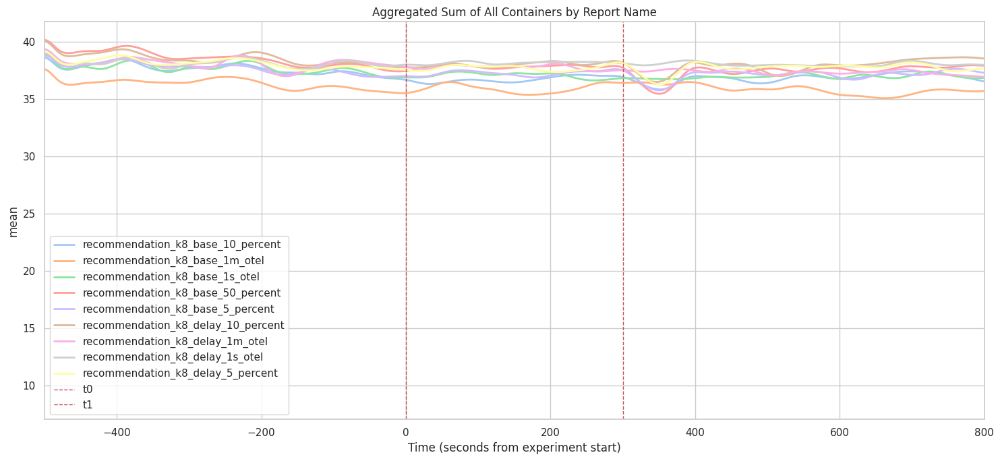

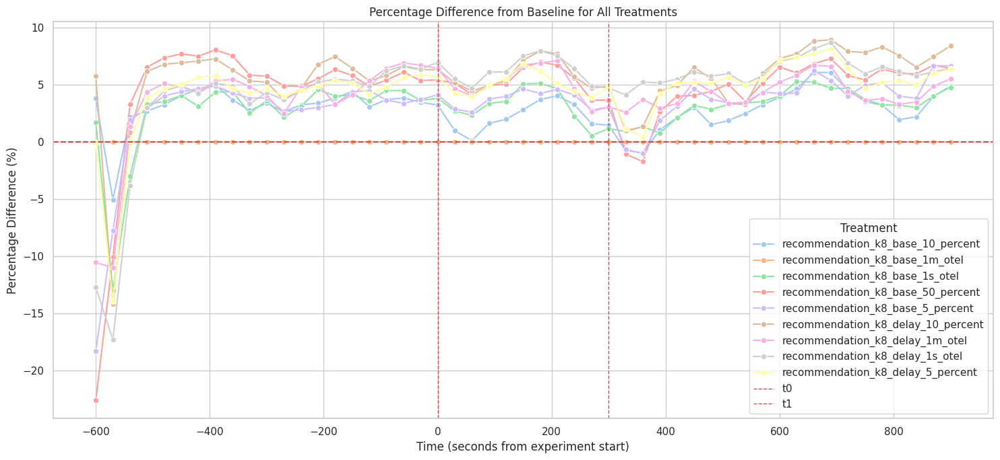

In [ ]:
plot_sum_aggregated_all_containers(combined_df, "mean", treatment_end_time, treatment_start_time)

#plot_percentage_difference_all_containers(combined_df, "mean", treatment_end_time, treatment_start_time)


combined_condensed_df = combined_df.groupby(["report_name", "rounded_experiment_seconds"])["mean"].sum().reset_index()



plot_percentage_difference_mean(combined_condensed_df, treatment_end_time, treatment_start_time)




## Powerconsumption of namespace

In [ ]:
# Directory containing reports
report_directory = "reports"

report_base_kepler_namespace = load_report_interactions(report_directory, report_names[0], "kepler_joules_namespace_combined_absolute", "empty_treatment")
report_delay_kepler_namespace = load_report_interactions(report_directory, report_names[1], "kepler_joules_namespace_combined_absolute", "delay_treatment")
report_delay_1s_kepler_namespace = load_report_interactions(report_directory, report_names[2], "kepler_joules_namespace_combined_absolute", "empty_treatment")
report_sampling_5_percent_kepler_namespace = load_report_interactions(report_directory, report_names[3], "kepler_joules_namespace_combined_absolute", "empty_treatment")
report_delay_5_percent_kepler_namespace = load_report_interactions(report_directory, report_names[4], "kepler_joules_namespace_combined_absolute", "delay_treatment")
report_base_10_percent_kepler_namespace = load_report_interactions(report_directory, report_names[5], "kepler_joules_namespace_combined_absolute", "empty_treatment")
report_delay_10_percent_kepler_namespace = load_report_interactions(report_directory, report_names[6], "kepler_joules_namespace_combined_absolute", "delay_treatment")


assert report_base_kepler_namespace is not None
assert report_delay_kepler_namespace is not None
assert report_delay_1s_kepler_namespace is not None
assert report_sampling_5_percent_kepler_namespace is not None
assert report_delay_5_percent_kepler_namespace is not None

Found 0 interactions for report_2025-02-27_19-22-16.yaml and empty_treatment.
Found 1 interactions for report_2025-02-26_19-43-55.yaml and delay_treatment.
Found 0 interactions for report_2025-02-25_15-20-44.yaml and empty_treatment.
Found 0 interactions for report_2025-02-21_18-07-30.yaml and empty_treatment.
Found 1 interactions for report_2025-02-20_15-03-41.yaml and delay_treatment.
Found 0 interactions for report_2025-02-19_16-02-02.yaml and empty_treatment.


IndexError: list index out of range

In [ ]:
def get_kepler_total_energy_consumption(interaction, treatment_name):
    treatment_start_end_values = {}
    for container_namespace, df in interaction.response_data.groupby("container_namespace"):
        treatment_df = df[df[treatment_name] == treatment_name]
        if not treatment_df.empty:
            # get the first and last value of the treatment
            treatment_start = treatment_df["kepler_joules_namespace_combined_absolute"].iloc[0]
            treatment_end = treatment_df["kepler_joules_namespace_combined_absolute"].iloc[-1]
            
            
            difference = treatment_end - treatment_start
            
            
            treatment_start_end_values[container_namespace] = (treatment_start, treatment_end, difference)
    return treatment_start_end_values

treatment_start_end = {}

values_base_kepler_namespace = get_kepler_total_energy_consumption(report_base_kepler_namespace, "empty_treatment")
values_delay_kepler_namespace = get_kepler_total_energy_consumption(report_delay_kepler_namespace, "delay_treatment")
values_delay_1s_kepler_namespace = get_kepler_total_energy_consumption(report_delay_1s_kepler_namespace, "empty_treatment")
values_sampling_5_percent_kepler_namespace = get_kepler_total_energy_consumption(report_sampling_5_percent_kepler_namespace, "empty_treatment")
values_delay_5_percent_kepler_namespace = get_kepler_total_energy_consumption(report_delay_5_percent_kepler_namespace, "delay_treatment")
values_base_10_percent_kepler_namespace = get_kepler_total_energy_consumption(report_base_10_percent_kepler_namespace, "empty_treatment")
values_delay_10_percent_kepler_namespace = get_kepler_total_energy_consumption(report_delay_10_percent_kepler_namespace, "delay_treatment")

for container_namespace, values in values_base_kepler_namespace.items():
    percentage_differece_delay = (values_delay_kepler_namespace[container_namespace][2] - values_base_kepler_namespace[container_namespace][2]) / values_base_kepler_namespace[container_namespace][2] * 100
    percentage_differece_delay_1s = (values_delay_1s_kepler_namespace[container_namespace][2] - values_delay_kepler_namespace[container_namespace][2]) / values_base_kepler_namespace[container_namespace][2] * 100
    percentage_differece_5percent = (values_sampling_5_percent_kepler_namespace[container_namespace][2] - values_delay_kepler_namespace[container_namespace][2]) / values_base_kepler_namespace[container_namespace][2] * 100
    percentage_differece_5percent_delay = (values_delay_5_percent_kepler_namespace[container_namespace][2] - values_base_kepler_namespace[container_namespace][2]) / values_base_kepler_namespace[container_namespace][2] * 100
    percentage_differece_10percent_base = (values_base_10_percent_kepler_namespace[container_namespace][2] - values_base_kepler_namespace[container_namespace][2]) / values_base_kepler_namespace[container_namespace][2] * 100
    percentage_differece_10percent_delay = (values_delay_10_percent_kepler_namespace[container_namespace][2] - values_base_kepler_namespace[container_namespace][2]) / values_base_kepler_namespace[container_namespace][2] * 100
    print(f"Namespace: {container_namespace}")
    print(f"Base Treatment: {values_base_kepler_namespace[container_namespace][2]}")
    print(f"Delay Treatment: {values_delay_kepler_namespace[container_namespace][2]} ({percentage_differece_delay:.2f}%)")
    print(f"Delay 1s Treatment: {values_delay_1s_kepler_namespace[container_namespace][2]} ({percentage_differece_delay_1s:.2f}%)")
    print(f"5% Treatment: {values_sampling_5_percent_kepler_namespace[container_namespace][2]} ({percentage_differece_5percent:.2f}%)")
    print(f"5% Delay Treatment: {values_delay_5_percent_kepler_namespace[container_namespace][2]} ({percentage_differece_5percent_delay:.2f}%)")
    print(f"10% Treatment: {values_base_10_percent_kepler_namespace[container_namespace][2]} ({percentage_differece_10percent_base:.2f}%)")
    print(f"10% Delay Treatment: {values_delay_10_percent_kepler_namespace[container_namespace][2]} ({percentage_differece_10percent_delay:.2f}%)")
    print("-----------------------------------------------")

Namespace: system-under-evaluation
Base Treatment: 18454.247999999992
Delay Treatment: 20307.263999999996 (10.04%)
Delay 1s Treatment: 18713.195999999996 (-8.64%)
5% Treatment: 18627.996000000006 (-9.10%)
5% Delay Treatment: 19884.618000000002 (7.75%)
10% Treatment: 18592.691999999995 (0.75%)
10% Delay Treatment: 20673.07499999999 (12.02%)
-----------------------------------------------
